In [1]:
import meshio
import numpy as np
from dolfinx import mesh, fem
from mpi4py import MPI
import basix
import pyvista as pv

from dolfinx.io import XDMFFile

[Rohans-MacBook-Pro.local:16955] shmem: mmap: an error occurred while determining whether or not /var/folders/hj/g_ncdftd5lncyq_628n7jckw0000gn/T//ompi.Rohans-MacBook-Pro.501/jf.0/2350186496/sm_segment.Rohans-MacBook-Pro.501.8c150000.0 could be created.


In [3]:
%pip install tetgen pyvista

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for tetgen: filename=tetgen-0.6.5-cp313-cp313-macosx_10_13_x86_64.whl size=476464 sha256=af650cf3d72a4c2b30bc53e194cf740281019b2015a816cd200656079a57a3a9
  Stored in directory: /Users/rgopalam/Library/Caches/pip/wheels/5e/65/04/c2b61fbf312cdbab142267acf220dfbbc16a467dca96b53715
Successfully built tetgen
Note: you may need to restart the kernel to use updated packages.


pitch: [0.1 0.1 0.1] <class 'trimesh.caching.TrackedArray'>


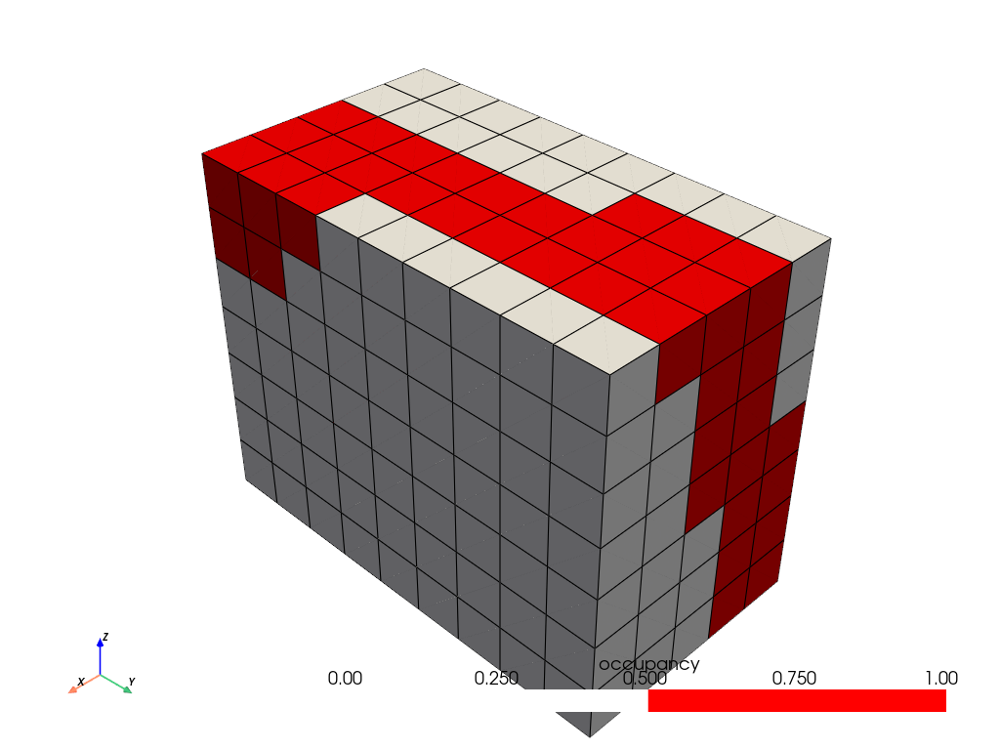

In [2]:
import numpy as np
import pyvista as pv
import trimesh

mesh = trimesh.load('test.stl')
voxel_size = 0.1
voxel_grid = mesh.voxelized(pitch=voxel_size)

occupancy = voxel_grid.matrix
origin = voxel_grid.bounds[0]

# Check the nature of voxel_grid.pitch
pitch_val = voxel_grid.pitch
print("pitch:", pitch_val, type(pitch_val))

# If it's a single float or single-element array:
if isinstance(pitch_val, np.ndarray):
    if pitch_val.size == 1:
        pitch = float(pitch_val.item())
        grid_spacing = (pitch, pitch, pitch)
    else:
        # Multiple values, assume this is a 3-element spacing
        grid_spacing = tuple(map(float, pitch_val))
else:
    # If it's already a float
    grid_spacing = (float(pitch_val), float(pitch_val), float(pitch_val))

X, Y, Z = occupancy.shape
grid = pv.ImageData()
grid.dimensions = (X+1, Y+1, Z+1)
grid.origin = origin
grid.spacing = grid_spacing

values = occupancy.astype(np.uint8).ravel(order='F')
grid.cell_data["occupancy"] = values

plotter = pv.Plotter()
plotter.add_mesh(grid, show_edges=True, scalars="occupancy", cmap=["white", "red"])
plotter.add_axes()
plotter.show()


In [4]:
%pip install scipy


Note: you may need to restart the kernel to use updated packages.


Best rotation found with area: 0.5117337273598408


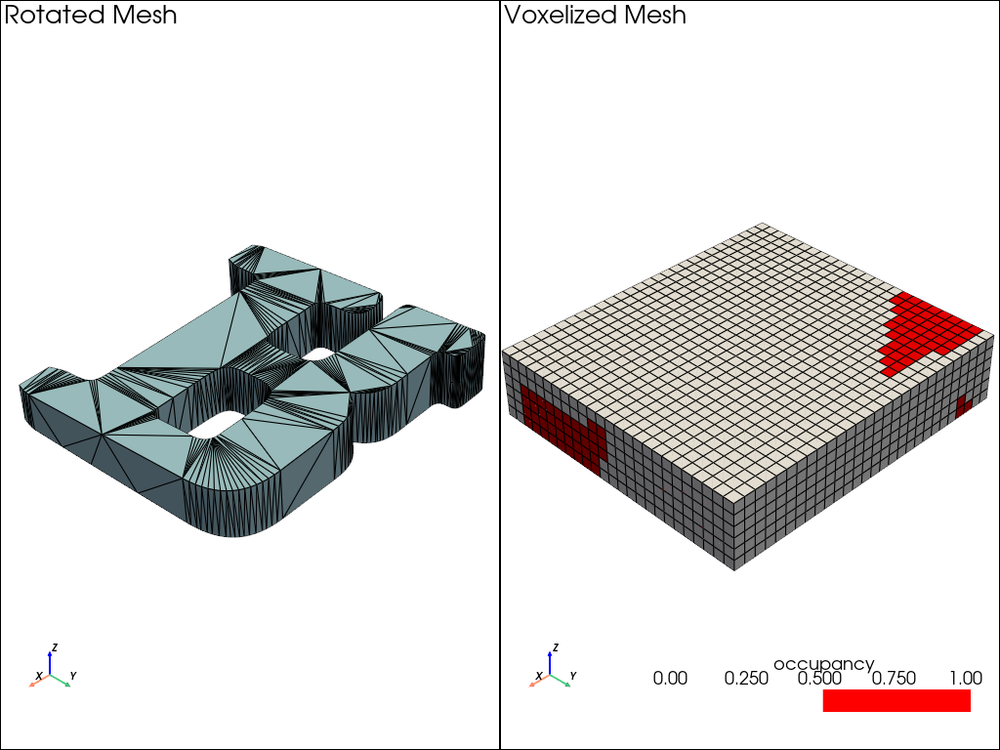

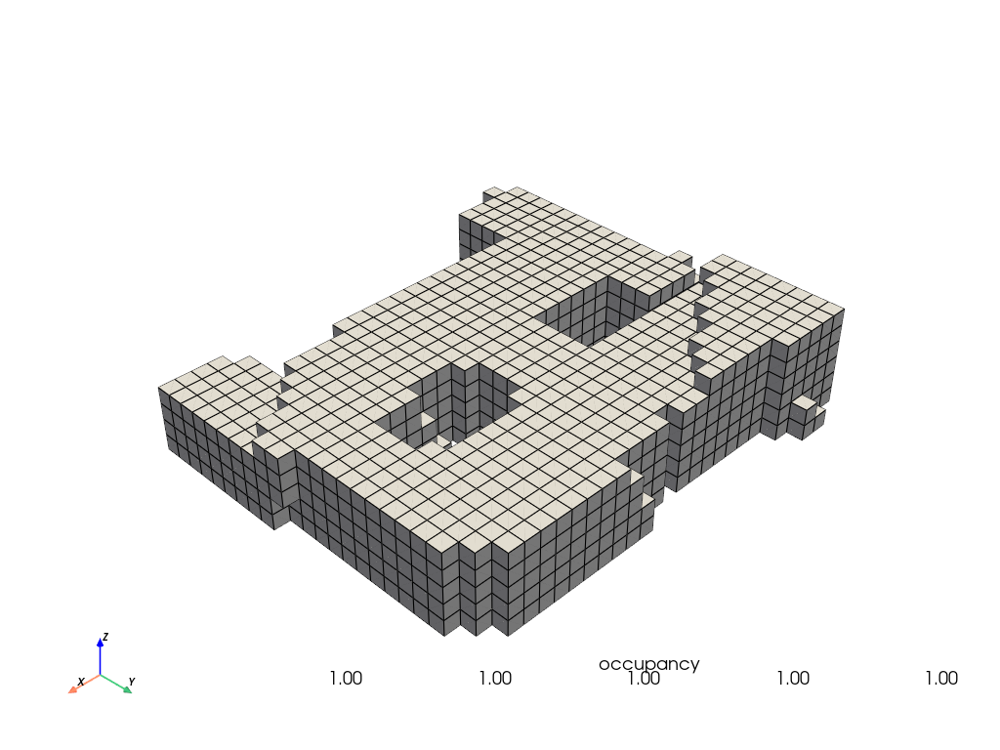

In [3]:
import trimesh
import numpy as np
import pyvista as pv
from scipy.spatial import ConvexHull

mesh = trimesh.load('test.stl')

# Compute stable poses
poses, probs = mesh.compute_stable_poses()

max_area = 0.0
best_pose = None

for transform in poses:
    # Apply pose to a copy of the mesh
    posed_mesh = mesh.copy()
    posed_mesh.apply_transform(transform)
    
    # Project vertices onto XY-plane
    points_2d = posed_mesh.vertices[:, :2]
    
    # Compute the 2D convex hull using SciPy
    hull = ConvexHull(points_2d)
    
    # In 2D, hull.volume corresponds to the polygon area of the hull
    area = hull.volume
    if area > max_area:
        max_area = area
        best_pose = transform

if best_pose is not None:
    print("Best rotation found with area:", max_area)
    # Apply this rotation permanently to the original mesh
    mesh.apply_transform(best_pose)

# Convert the rotated mesh to a PyVista mesh for display
# trimesh to pyvista conversion:
# - vertices: mesh.vertices (N x 3)
# - faces: mesh.faces is (M x 3)
#   Need to prepend each face with the number of vertices (3), resulting in (M x 4)
faces_pv = np.c_[np.full((mesh.faces.shape[0], 1), 3), mesh.faces]
pv_mesh = pv.PolyData(mesh.vertices, faces_pv)

# Now voxelize the tilted mesh
voxel_size = 0.03
voxel_grid = mesh.voxelized(pitch=voxel_size)

occupancy = voxel_grid.matrix
origin = voxel_grid.bounds[0]

pitch = voxel_grid.pitch
if isinstance(pitch, np.ndarray):
    if pitch.size == 1:
        pitch = float(pitch.item())
    else:
        pitch = float(pitch[0])

X, Y, Z = occupancy.shape

# Create a PyVista ImageData for voxel visualization
grid = pv.ImageData()
grid.dimensions = (X+1, Y+1, Z+1)
grid.origin = origin
grid.spacing = (pitch, pitch, pitch)

values = occupancy.astype(np.uint8).ravel(order='F')
grid.cell_data["occupancy"] = values

# Create a plotter with two subplots (1 row, 2 columns)
plotter = pv.Plotter(shape=(1, 2))

# Left subplot: Rotated mesh
plotter.subplot(0, 0)
plotter.add_mesh(pv_mesh, color="lightblue", show_edges=True)
plotter.add_axes()
plotter.add_text("Rotated Mesh", font_size=12)

# Right subplot: Voxelized Mesh
plotter.subplot(0, 1)
plotter.add_mesh(grid, show_edges=True, scalars="occupancy", cmap=["white", "red"])
plotter.add_axes()
plotter.add_text("Voxelized Mesh", font_size=12)

plotter.show()

# Threshold the grid so we only keep cells with occupancy > 0.5
occupied_only = grid.threshold(value=0.5, scalars="occupancy")

plotter = pv.Plotter()
plotter.add_mesh(occupied_only, show_edges=True, scalars="occupancy", cmap=["white", "red"])
plotter.add_axes()
plotter.show()



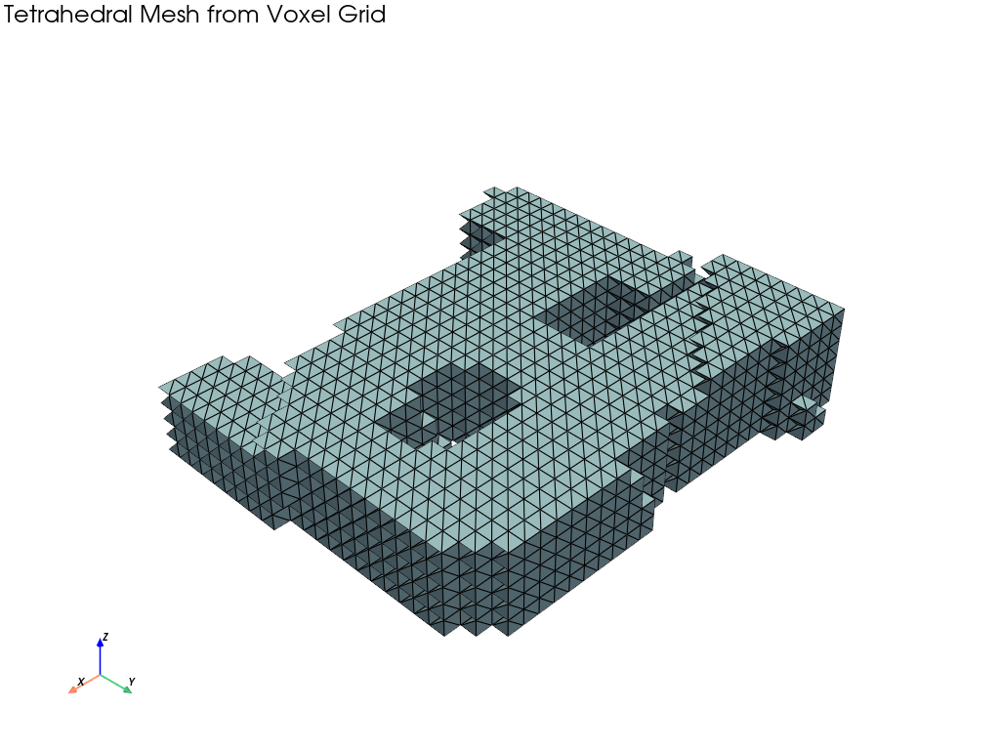

In [4]:
import trimesh

nx, ny, nz = X+1, Y+1, Z+1
points = np.zeros((nx*ny*nz, 3))
for k in range(nz):
    for j in range(ny):
        for i in range(nx):
            idx = i + nx*j + nx*ny*k
            points[idx] = [origin[0] + i*pitch,
                           origin[1] + j*pitch,
                           origin[2] + k*pitch]

# Each voxel is identified by (i, j, k) in [0..X-1, 0..Y-1, 0..Z-1]
# Let's tetrahedralize only occupied voxels
tets_stl = []
for k in range(Z):
    for j in range(Y):
        for i in range(X):
            if occupancy[i, j, k] == 1:
                # Corner point IDs of this voxel
                v0 = i     + nx*j       + nx*ny*k
                v1 = (i+1) + nx*j       + nx*ny*k
                v2 = (i+1) + nx*(j+1)   + nx*ny*k
                v3 = i     + nx*(j+1)   + nx*ny*k
                v4 = i     + nx*j       + nx*ny*(k+1)
                v5 = (i+1) + nx*j       + nx*ny*(k+1)
                v6 = (i+1) + nx*(j+1)   + nx*ny*(k+1)
                v7 = i     + nx*(j+1)   + nx*ny*(k+1)

                # Add the 5 tetrahedra from this voxel
                tets_stl.append([v0, v1, v2, v6])
                tets_stl.append([v0, v2, v3, v6])
                tets_stl.append([v0, v4, v5, v6])
                tets_stl.append([v0, v3, v7, v6])
                tets_stl.append([v0, v4, v7, v6])

tets_stl = np.array(tets_stl, dtype=np.int64)

# Construct a PyVista UnstructuredGrid for the tetra mesh
# VTK format: [npts_in_cell, p0, p1, p2, p3, ...]
cells = np.hstack([np.full((len(tets_stl),1),4), tets_stl]).ravel()  # 4 points per tet
cell_type = np.full(len(tets_stl), 10, dtype=np.uint8)

tet_grid = pv.UnstructuredGrid(cells, cell_type, points)

# Visualize the tetrahedral mesh
plotter = pv.Plotter()
plotter.add_mesh(tet_grid, show_edges=True)
plotter.add_axes()
plotter.add_text("Tetrahedral Mesh from Voxel Grid", font_size=12)
plotter.show()

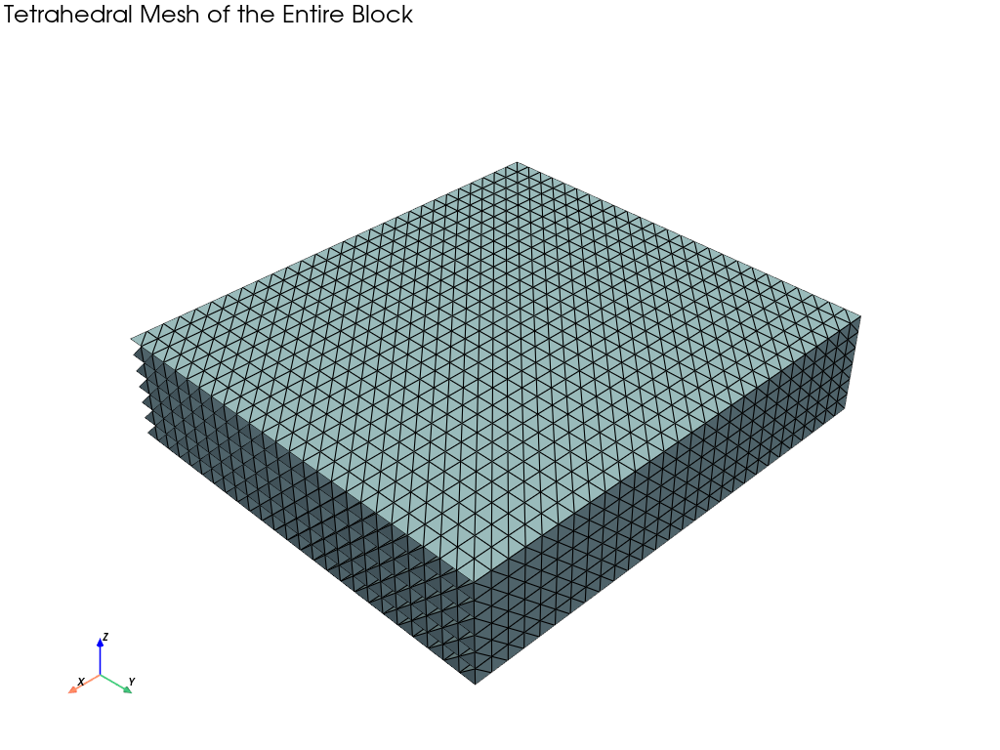

In [5]:
nx, ny, nz = X+1, Y+1, Z+1
points = np.zeros((nx*ny*nz, 3))
for k in range(nz):
    for j in range(ny):
        for i in range(nx):
            idx = i + nx*j + nx*ny*k
            points[idx] = [origin[0] + i*pitch,
                           origin[1] + j*pitch,
                           origin[2] + k*pitch]

# Create tets_total for ALL voxels in the entire block
tets_total = []
for k in range(Z):
    for j in range(Y):
        for i in range(X):
            # Corner indices of this voxel
            v0 = i     + nx*j       + nx*ny*k
            v1 = (i+1) + nx*j       + nx*ny*k
            v2 = (i+1) + nx*(j+1)   + nx*ny*k
            v3 = i     + nx*(j+1)   + nx*ny*k
            v4 = i     + nx*j       + nx*ny*(k+1)
            v5 = (i+1) + nx*j       + nx*ny*(k+1)
            v6 = (i+1) + nx*(j+1)   + nx*ny*(k+1)
            v7 = i     + nx*(j+1)   + nx*ny*(k+1)

            # Add the 5 tetrahedra from this voxel
            tets_total.append([v0, v1, v2, v6])
            tets_total.append([v0, v2, v3, v6])
            tets_total.append([v0, v4, v5, v6])
            tets_total.append([v0, v3, v7, v6])
            tets_total.append([v0, v4, v7, v6])

tets_total = np.array(tets_total, dtype=np.int64)

# Construct the UnstructuredGrid
cells = np.hstack([np.full((len(tets_total),1),4), tets_total]).ravel()
cell_type = np.full(len(tets_total), 10, dtype=np.uint8)  # 10 = VTK_TET

tet_grid = pv.UnstructuredGrid(cells, cell_type, points)

# Visualize the full block tetra mesh
plotter = pv.Plotter()
plotter.add_mesh(tet_grid, show_edges=True)
plotter.add_axes()
plotter.add_text("Tetrahedral Mesh of the Entire Block", font_size=12)
plotter.show()

In [6]:
# Create a meshio.Mesh
mesh_data = meshio.Mesh(
    points=points,
    cells=[("tetra", tets_total)]
)

# Specify the XDMF file name
xdmf_file = "converted_mesh.xdmf"

# Write the XDMF file with meshio
meshio.write(xdmf_file, mesh_data, file_format="xdmf")

# Load the XDMF file into DOLFINx
with XDMFFile(MPI.COMM_WORLD, xdmf_file, "r") as xdmf:
    domain_mesh = xdmf.read_mesh(name="Grid")  # 'Grid' is the default name from meshio
    print(f"Loaded mesh with {domain_mesh.topology.index_map(domain_mesh.topology.dim).size_local} cells")

Loaded mesh with 21000 cells


In [7]:
from mpi4py import MPI

x_min = domain_mesh.geometry.x[:, 0].min()
x_max = domain_mesh.geometry.x[:, 0].max()

y_min = domain_mesh.geometry.x[:, 1].min()
y_max = domain_mesh.geometry.x[:, 1].max()

z_min = domain_mesh.geometry.x[:, 2].min()
z_max = domain_mesh.geometry.x[:, 2].max()

x_mid = 0.5 * (x_min + x_max)
y_mid = 0.5 * (y_min + y_max)
z_mid = 0.5 * (z_min + z_max)

domain_mesh.geometry.x[:, 0] -= x_mid
domain_mesh.geometry.x[:, 1] -= y_mid
domain_mesh.geometry.x[:, 2] -= z_mid

# Recompute bounds
x_min = domain_mesh.geometry.x[:, 0].min()
x_max = domain_mesh.geometry.x[:, 0].max()

y_min = domain_mesh.geometry.x[:, 1].min()
y_max = domain_mesh.geometry.x[:, 1].max()

z_min = domain_mesh.geometry.x[:, 2].min()
z_max = domain_mesh.geometry.x[:, 2].max()

if MPI.COMM_WORLD.rank == 0:
    print(f"Mesh centered around origin:")
    print(f"X: [{x_min}, {x_max}]")
    print(f"Y: [{y_min}, {y_max}]")
    print(f"Z: [{z_min}, {z_max}]")


if MPI.COMM_WORLD.rank == 0:
    print(f"Mesh bounds:")
    print(f"X: [{x_min}, {x_max}]")
    print(f"Y: [{y_min}, {y_max}]")
    print(f"Z: [{z_min}, {z_max}]")


Mesh centered around origin:
X: [-0.41999999999999815, 0.4200000000000017]
Y: [-0.375, 0.375]
Z: [-0.08999999999999998, 0.09]
Mesh bounds:
X: [-0.41999999999999815, 0.4200000000000017]
Y: [-0.375, 0.375]
Z: [-0.08999999999999998, 0.09]


In [8]:
import ufl

# Temperature function space (scalar field)
element_temp = basix.ufl.element("Lagrange", domain_mesh.topology.cell_name(), degree=1)
V_T = fem.functionspace(domain_mesh, element_temp)

# Trial and test functions for temperature
T = ufl.TrialFunction(V_T)  # Current temperature
v_T = ufl.TestFunction(V_T)  # Test function

# Initial temperature field (T_prev)
T_prev = fem.Function(V_T)
T_prev.interpolate(lambda x: np.full(x.shape[1], 100.0))  # Initial temperature: 300 K


In [9]:
# Material properties
rho = 7800  # Density (kg/m^3)
cp = 500  # Specific heat capacity (J/kg·K)
k = 45  # Thermal conductivity (W/m·K)

# Time and layer parameters
layer_height = 0.2 # Height of each layer (m)
t_layer = 2.0       # Time per layer (s)
dt = 0.1            # Time step size (s)
num_steps_per_layer = int(t_layer / dt)

In [10]:
from dolfinx.mesh import locate_entities


# Dirichlet boundary conditions
domain_mesh.topology.create_connectivity(domain_mesh.topology.dim - 1, domain_mesh.topology.dim)

T_bc = fem.Function(V_T)
T_bc.interpolate(lambda x: np.full(x.shape[1], 100.0))  # Fixed boundary temperature

boundary_facets_T = locate_entities(
    domain_mesh, domain_mesh.topology.dim - 1, lambda x: np.isclose(x[0], 0.0)
)

# Locate degrees of freedom on these facets
boundary_dofs_T = fem.locate_dofs_topological(V_T, domain_mesh.topology.dim - 1, boundary_facets_T)

# Create Dirichlet BC
bc_T = fem.dirichletbc(T_bc, boundary_dofs_T)



In [28]:
%pip install shapely

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 7.7 MB/s eta 0:00:00-:--:--
Note: you may need to restart the kernel to use updated packages.


In [34]:
%pip install opencv-python

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.5/56.5 MB 21.0 MB/s eta 0:00:0000:0100:01
Note: you may need to restart the kernel to use updated packages.


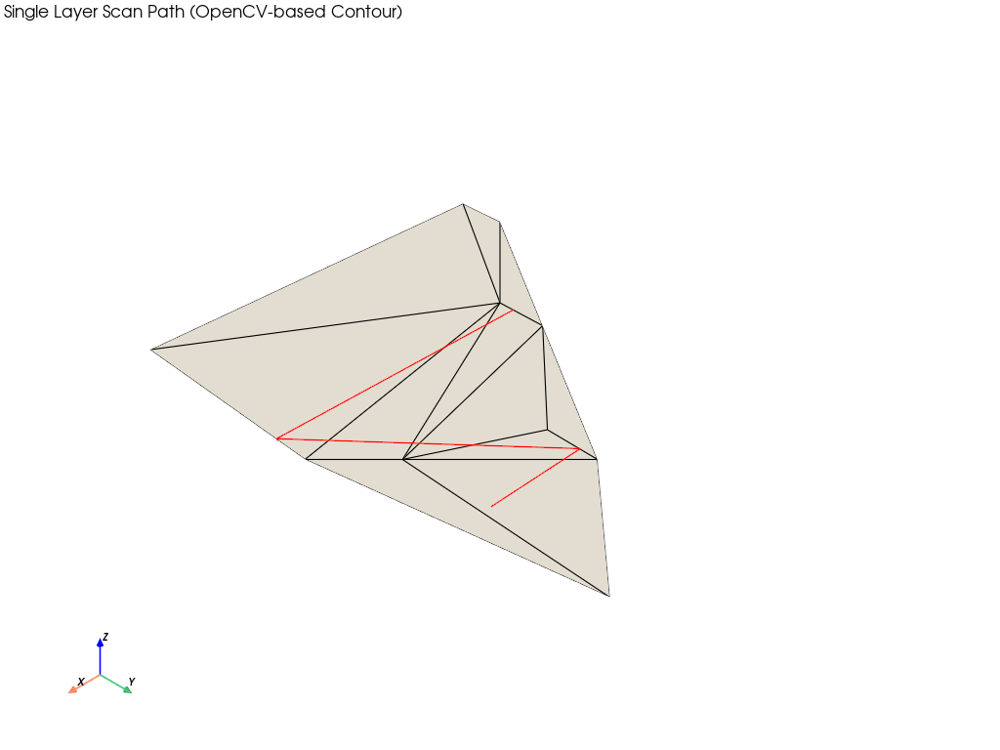

In [11]:
import numpy as np
import pyvista as pv
from shapely.geometry import Polygon, LineString, MultiLineString
import cv2

# Assume you have:
# - occupancy: 3D boolean or 0/1 array [X, Y, Z]
# - origin: (ox, oy, oz)
# - pitch: voxel size
# Replace these with your actual values.
X, Y, Z = occupancy.shape
top_layer_index = Z - 1
top_layer = occupancy[:, :, top_layer_index]

# Convert top_layer to a binary image for OpenCV
top_layer_img = (top_layer * 255).astype(np.uint8)

# Find contours using OpenCV
contours, hierarchy = cv2.findContours(top_layer_img, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

if len(contours) == 0:
    raise ValueError("No contour found in the top layer.")

# Choose the largest contour by area
largest_contour = max(contours, key=cv2.contourArea)

# Convert contour coordinates to real-world coordinates
# OpenCV contours have shape (N, 1, 2), with (x, y) coordinates
real_coords = []
for c in largest_contour:
    x_idx, y_idx = c[0]  # Contour points come as [[x, y]]
    x = origin[0] + x_idx * pitch
    y = origin[1] + y_idx * pitch
    # Use the selected top_layer_index for z
    z = origin[2] + top_layer_index * pitch
    real_coords.append((x, y))

# Create a polygon from the contour
polygon = Polygon(real_coords)

# Laser path parameters
velocity_x = 0.05   # m/s
dt = 0.1            # s
y_step = 0.1         # spacing between passes in y-direction

minx, miny, maxx, maxy = polygon.bounds
distance_x = maxx - minx
total_time_x = distance_x / velocity_x
num_steps_x = int(total_time_x / dt)
y_positions = np.arange(miny, maxy, y_step)

lines = []
for y_line in y_positions:
    # Create a horizontal line at this y
    line = LineString([(minx, y_line), (maxx, y_line)])
    intersect = polygon.intersection(line)
    if not intersect.is_empty:
        if intersect.geom_type == 'LineString':
            lines.append(intersect)
        elif intersect.geom_type == 'MultiLineString':
            for seg in intersect:
                lines.append(seg)

# Convert lines into path points
path_points = []
for segment in lines:
    sx, sy = segment.coords[0]
    ex, ey = segment.coords[-1]
    dx = ex - sx
    total_time = dx / velocity_x
    steps = int(total_time / dt)
    for step in range(steps+1):
        t = step * dt
        x_pos = sx + velocity_x * t
        if x_pos > ex:
            x_pos = ex
        path_points.append([x_pos, sy, z])

path_points = np.array(path_points)

# Visualize using PyVista
plotter = pv.Plotter()
plotter.add_axes()

boundary_coords = np.array(polygon.exterior.coords)  # Shape (N,2)
z_value = z  # The z coordinate of the layer
boundary_coords_3d = np.hstack([boundary_coords, np.full((boundary_coords.shape[0], 1), z_value)])

boundary_poly = pv.PolyData(boundary_coords_3d)
boundary_poly = boundary_poly.delaunay_2d()  # Create a filled polygon
plotter.add_mesh(boundary_poly, color="white", show_edges=True, label="Object Footprint")

# Create a line for the path
if len(path_points) > 1:
    line = pv.lines_from_points(path_points)
    plotter.add_mesh(line, color="red", line_width=3, label="Heat Source Path")

plotter.add_text("Single Layer Scan Path (OpenCV-based Contour)", position="upper_left", font_size=10)
plotter.show()


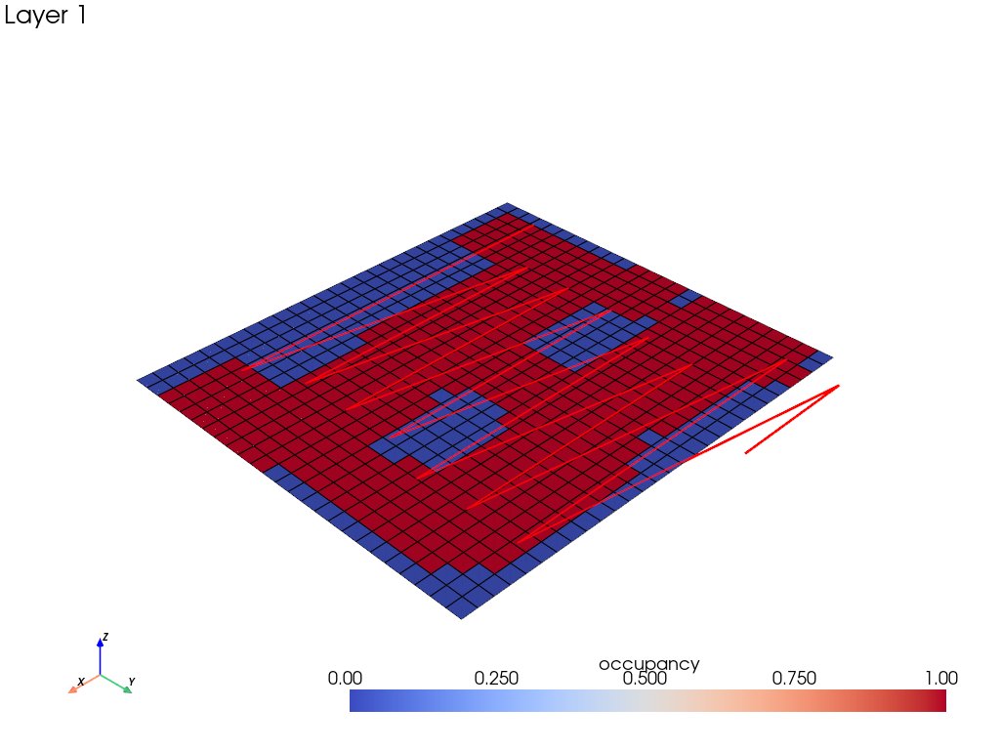

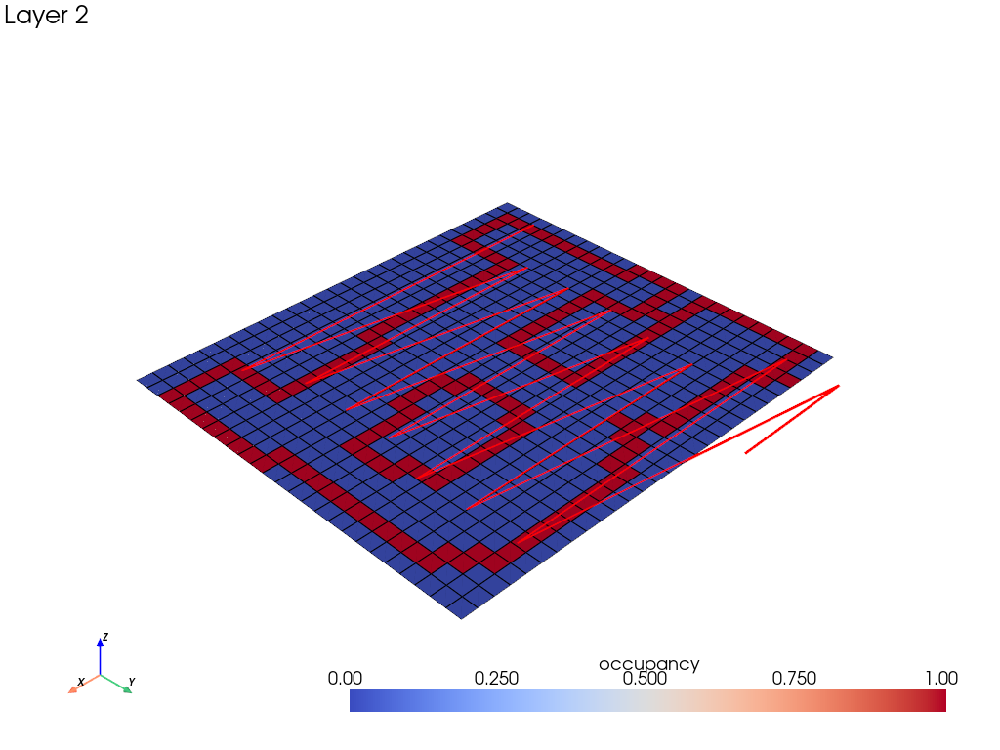

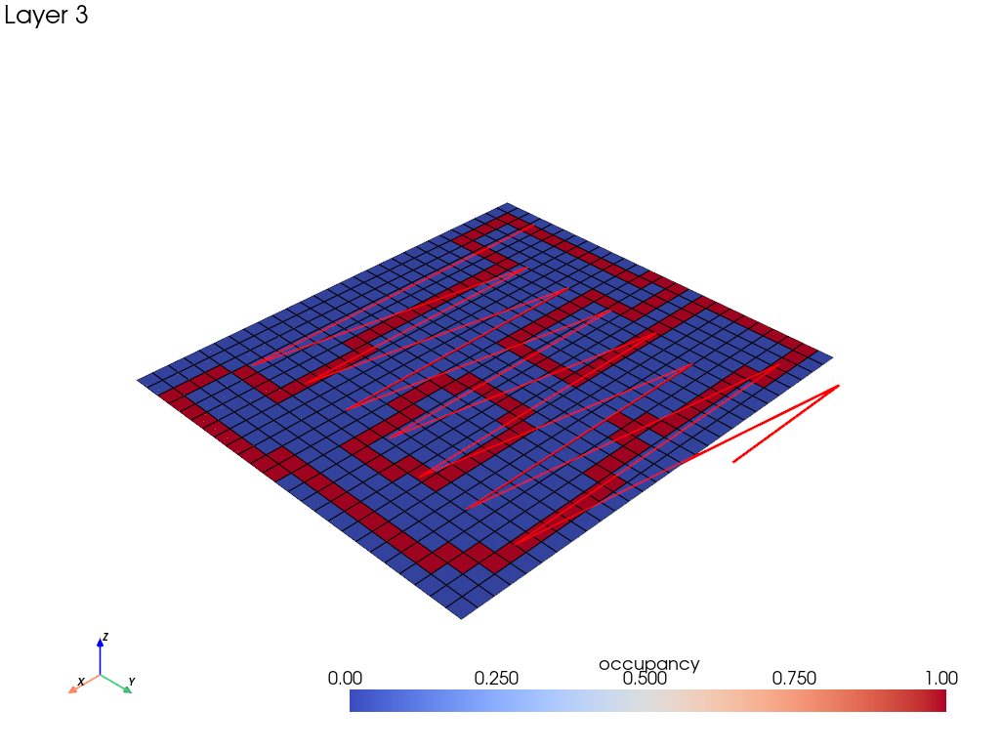

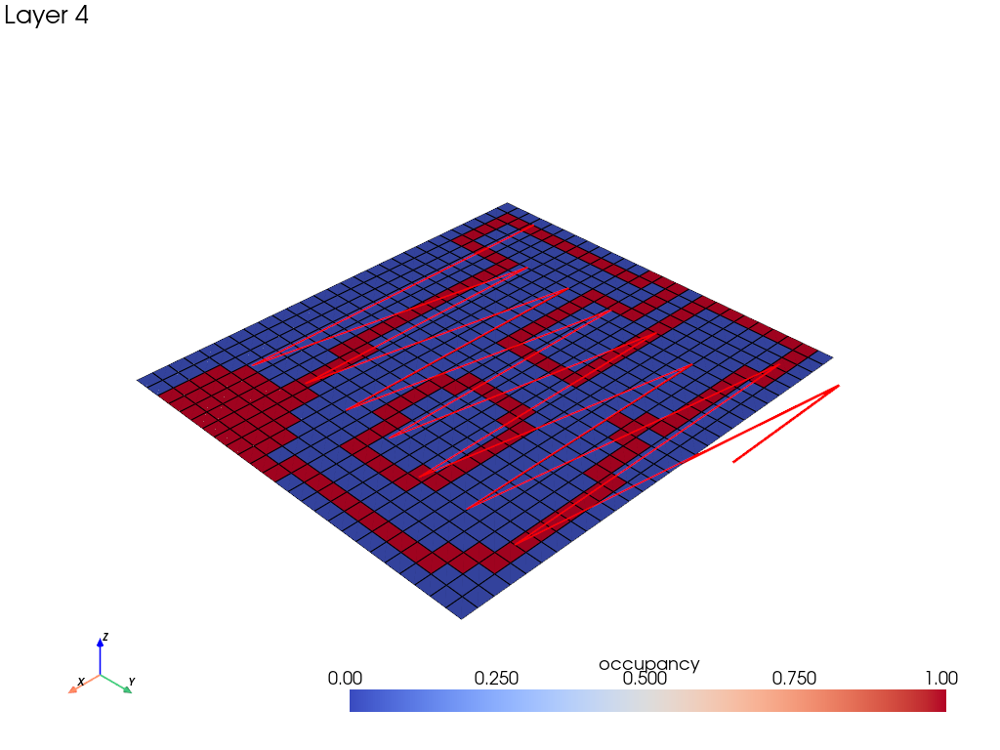

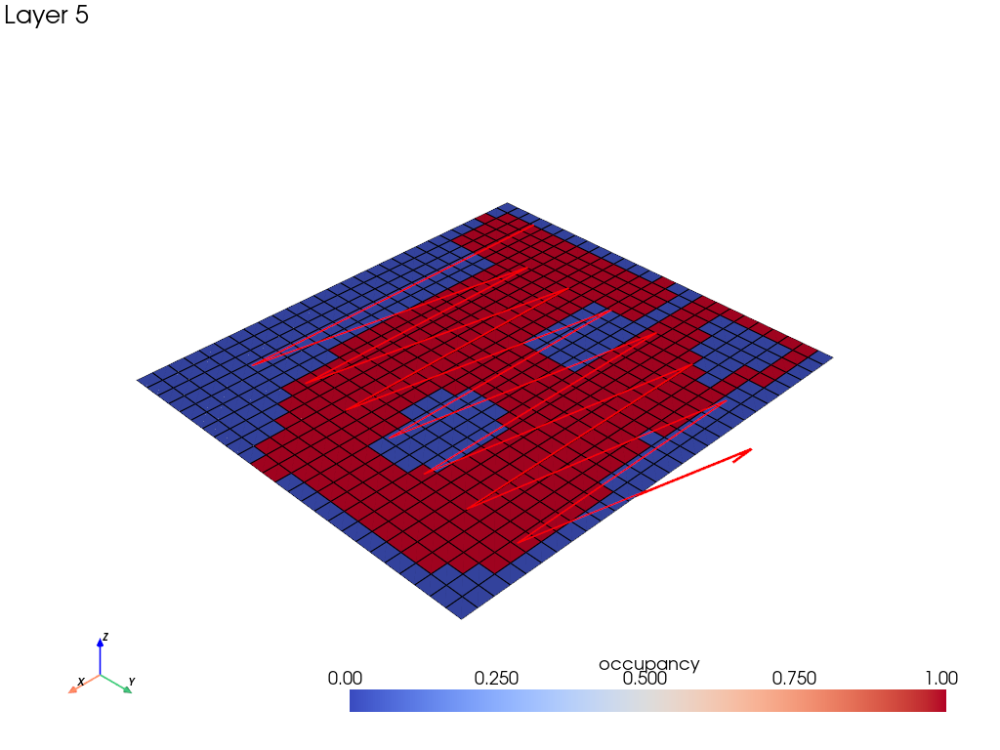

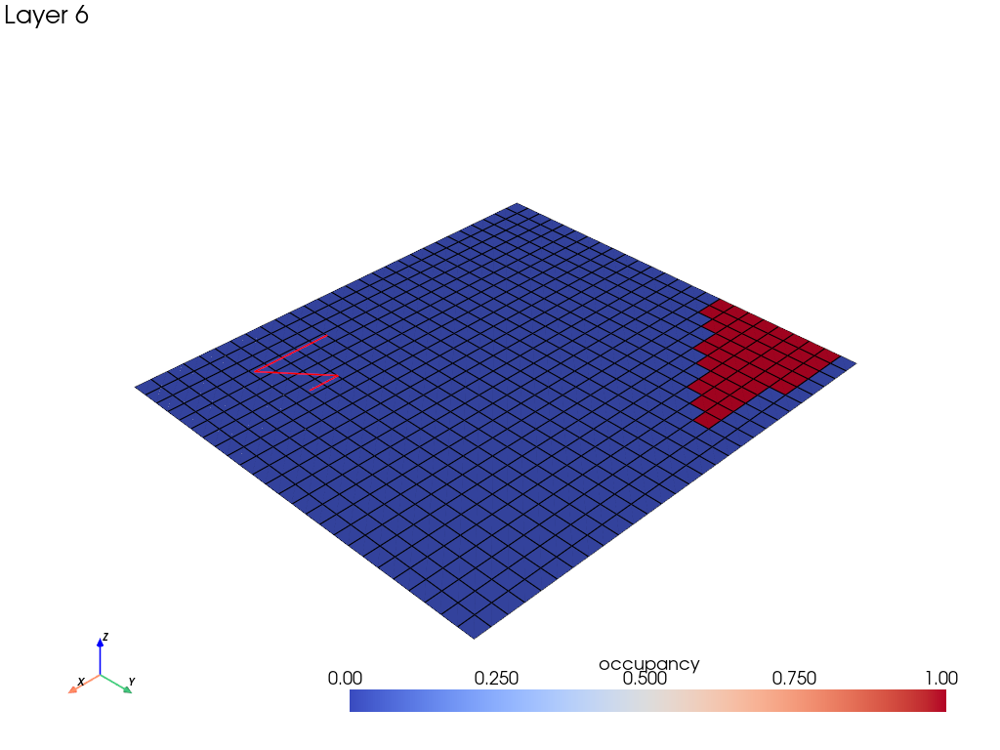

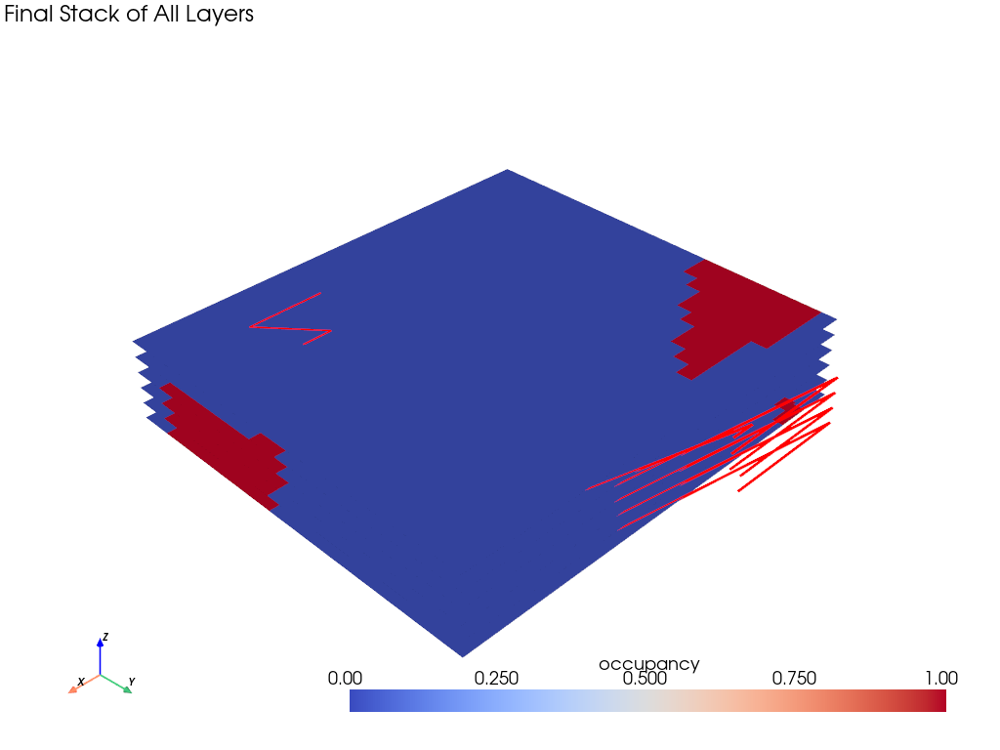

In [13]:
import numpy as np
import pyvista as pv
import cv2
from shapely.geometry import Polygon, LineString
from shapely.ops import unary_union

# Assume you have these:
# occupancy: 3D numpy array (X, Y, Z) with 0/1 indicating empty or filled voxels
# origin: (ox, oy, oz)
# pitch: voxel size
# velocity_x, dt, y_step as scanning parameters

X, Y, Z = occupancy.shape
velocity_x = 0.05   # m/s
dt = 0.1            # s
y_step = 0.1         # spacing between passes in y-direction

all_layers_path_points = []  # store all layers' path points for final stack visualization
all_layers_grids = []        # store all layers' grids for final stack visualization

for k in range(Z):
    slice_k = occupancy[:, :, k]
    # Convert to a binary image for OpenCV contours
    slice_img = (slice_k * 255).astype(np.uint8)

    # Find contours for this layer
    contours, hierarchy = cv2.findContours(slice_img, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if len(contours) == 0:
        # No material in this layer, skip
        continue

    # Pick largest contour by area
    largest_contour = max(contours, key=cv2.contourArea)
    # Convert contour to real-world coords
    layer_z = origin[2] + k * pitch
    real_coords = []
    for c in largest_contour:
        x_idx, y_idx = c[0]
        x = origin[0] + x_idx * pitch
        y = origin[1] + y_idx * pitch
        real_coords.append((x, y))

    polygon = Polygon(real_coords)
    if polygon.is_empty:
        continue

    minx, miny, maxx, maxy = polygon.bounds
    distance_x = maxx - minx
    total_time_x = distance_x / velocity_x
    num_steps_x = int(total_time_x / dt)
    y_positions = np.arange(miny, maxy, y_step)

    # Generate path inside polygon
    layer_path_points = []
    for y_line in y_positions:
        line = LineString([(minx, y_line), (maxx, y_line)])
        intersect = polygon.intersection(line)
        if not intersect.is_empty:
            # Handle LineString or MultiLineString
            if intersect.geom_type == 'LineString':
                segments = [intersect]
            elif intersect.geom_type == 'MultiLineString':
                segments = list(intersect.geoms)
            else:
                segments = []

            for seg in segments:
                sx, sy = seg.coords[0]
                ex, ey = seg.coords[-1]
                dx = ex - sx
                segment_time = dx / velocity_x
                segment_steps = int(segment_time / dt)
                for step in range(segment_steps+1):
                    t = step * dt
                    x_pos = sx + velocity_x * t
                    if x_pos > ex:
                        x_pos = ex
                    layer_path_points.append([x_pos, sy, layer_z])

    layer_path_points = np.array(layer_path_points)
    all_layers_path_points.append(layer_path_points)

    # Now visualize THIS layer alone
    # Create an ImageData for the slice
    # We have X by Y cells in this layer. We'll create (X+1, Y+1, 2) points to form a single cell-thick layer.
    nx, ny = X+1, Y+1
    layer_grid = pv.ImageData()
    layer_grid.origin = (origin[0], origin[1], layer_z)
    layer_grid.spacing = (pitch, pitch, 0.001 * pitch)  # A small thickness
    layer_grid.dimensions = (nx, ny, 2)  # X+1 by Y+1 by 2 points => X by Y by 1 cell-thick layer

    # Flatten occupancy slice to match cell data shape
    # We have X*Y cells and 1 layer in z => X*Y cells total
    cell_values = slice_k.astype(np.uint8).ravel(order='F')
    layer_grid.cell_data["occupancy"] = cell_values

    # For visualization of THIS layer
    layer_plotter = pv.Plotter()
    layer_plotter.add_axes()
    # Add voxel layer, using occupancy. 
    # Use a colormap so occupied cells are visible (e.g. 'coolwarm')
    layer_plotter.add_mesh(layer_grid, scalars="occupancy", show_edges=True, cmap="coolwarm")

    # Add path line if we have points
    if len(layer_path_points) > 1:
        line = pv.lines_from_points(layer_path_points)
        layer_plotter.add_mesh(line, color="red", line_width=3, label=f"Layer {k+1} Path")

    layer_plotter.add_text(f"Layer {k+1}", position="upper_left", font_size=10)
    # Show this layer alone
    layer_plotter.show()

    # Store for final stack visualization
    all_layers_grids.append((layer_grid, layer_path_points))


# After we have shown each layer individually, now show the final stack
final_plotter = pv.Plotter()
final_plotter.add_axes()
for idx, (g, p_points) in enumerate(all_layers_grids):
    # Add the layer grid
    final_plotter.add_mesh(g, scalars="occupancy", show_edges=False, cmap="coolwarm")
    # Add the path line if available
    if len(p_points) > 1:
        line = pv.lines_from_points(p_points)
        final_plotter.add_mesh(line, color="red", line_width=3)

final_plotter.add_text("Final Stack of All Layers", position="upper_left", font_size=10)
final_plotter.show()


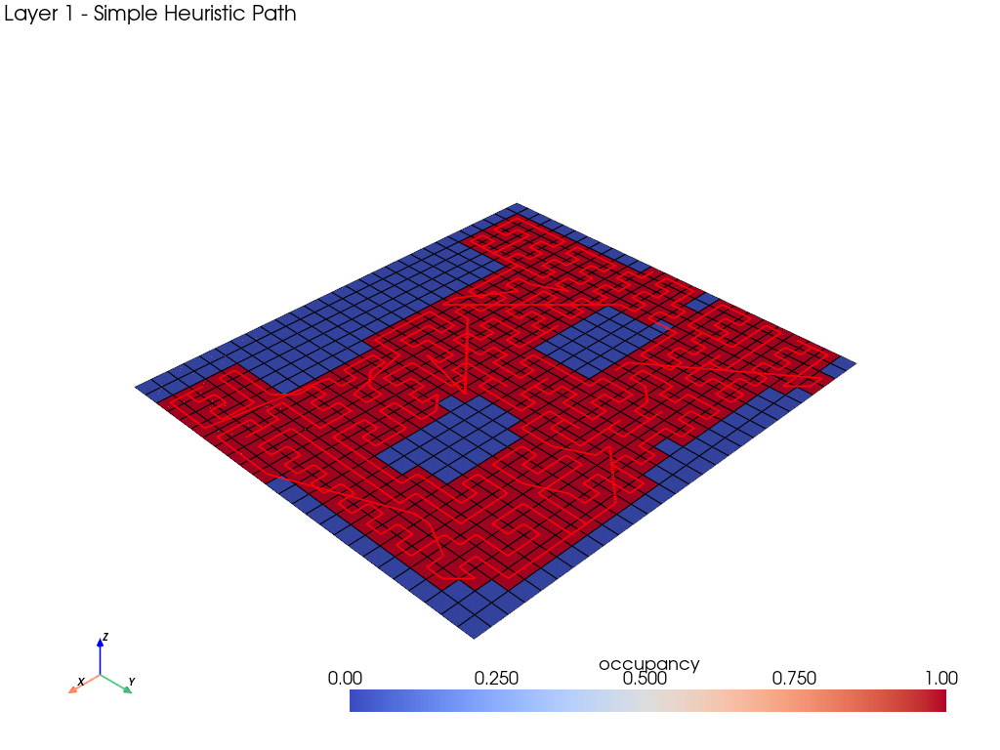

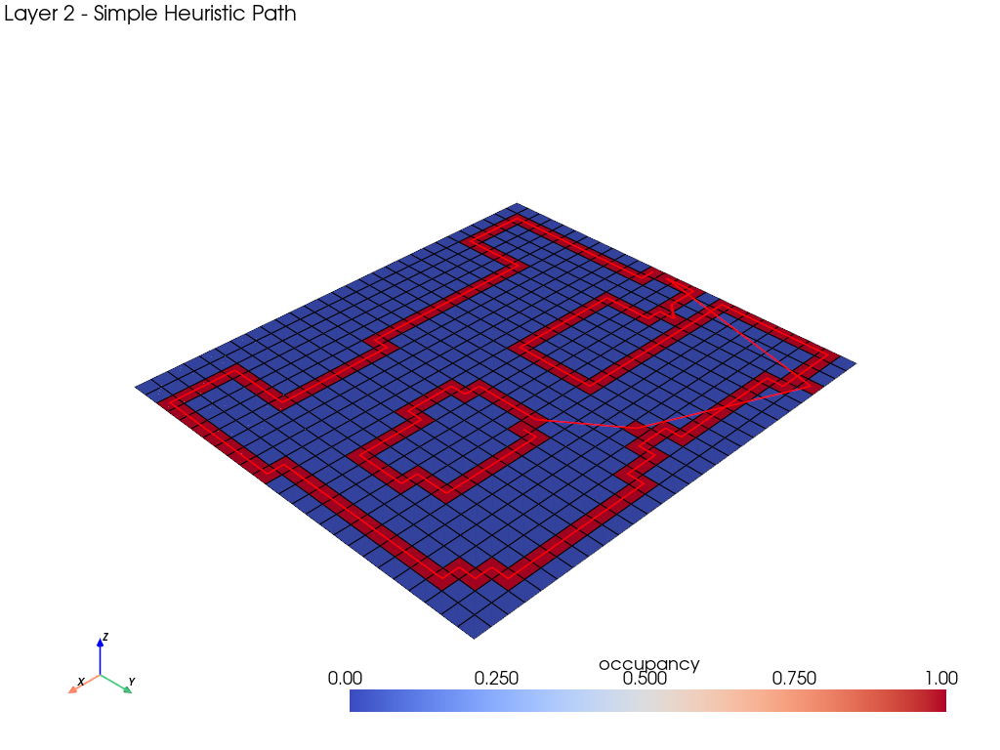

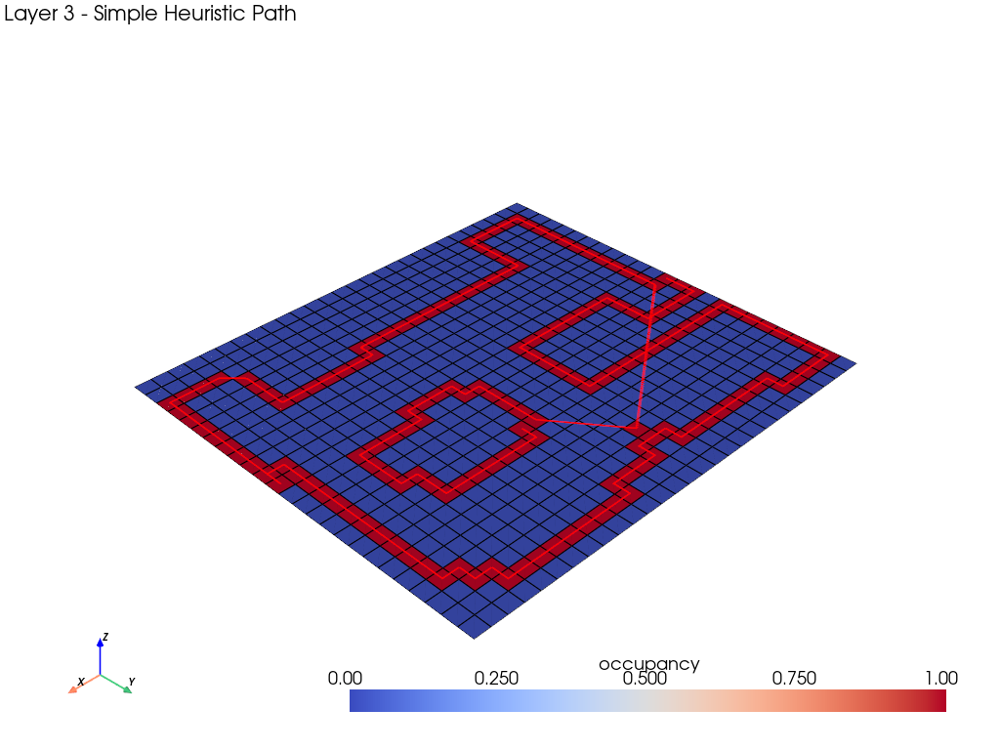

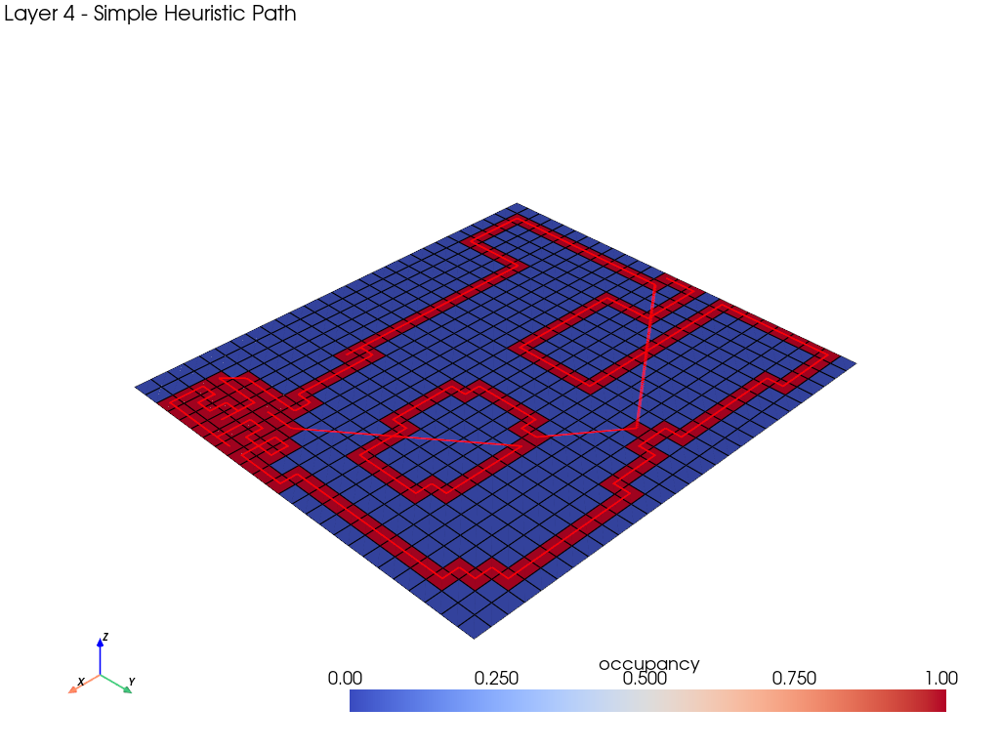

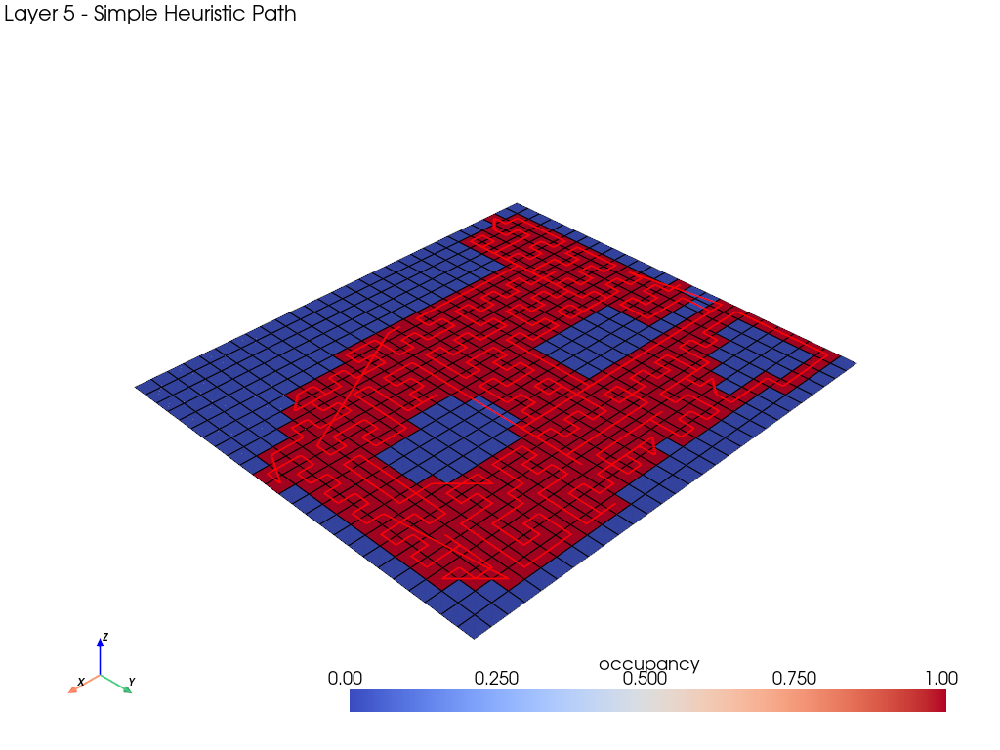

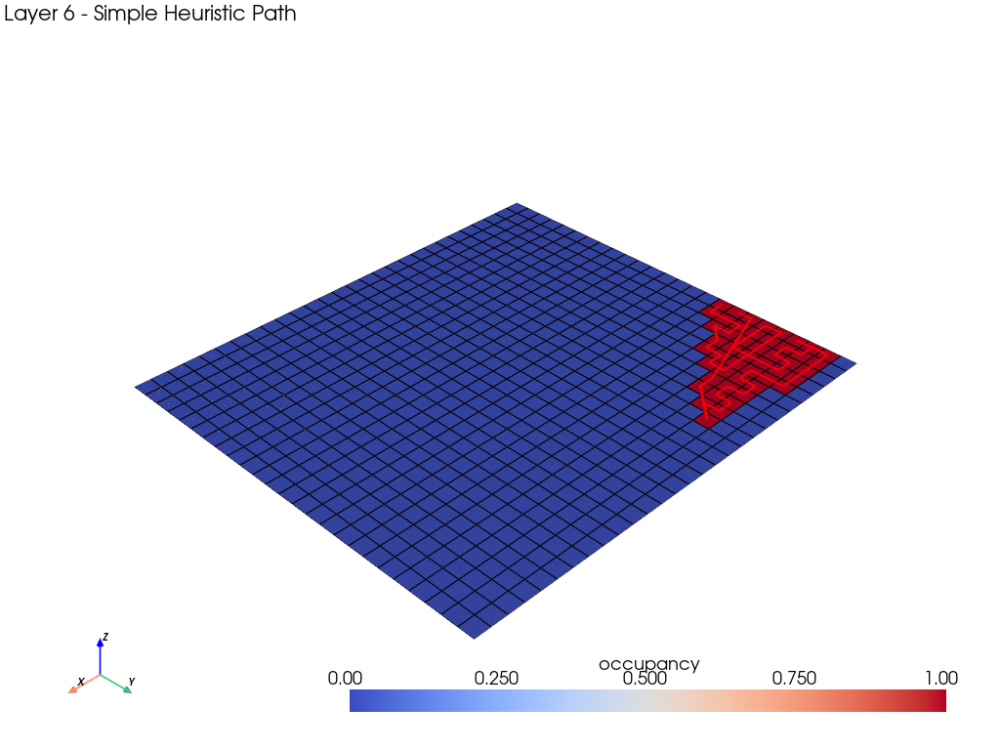

In [20]:
import numpy as np
import pyvista as pv
import cv2
from scipy.spatial import cKDTree

# Parameters
pitch = 0.03     # voxel size
origin = (0.0, 0.0, 0.0)
velocity = 0.05  # m/s
dt = 0.1         # s

# Assume we have:
# occupancy: 3D numpy array (X, Y, Z) with 1 = occupied (red) and 0 = empty (blue)
X, Y, Z = occupancy.shape

for k in range(Z):
    slice_k = occupancy[:, :, k]
    layer_z = origin[2] + k * pitch

    # Identify all occupied cells
    # slice_k(i,j)=1 means occupied
    occupied_indices = np.argwhere(slice_k == 1)  # returns list of [i, j] with i = y, j = x
    if occupied_indices.size == 0:
        continue  # No occupied cells in this layer

    # Convert indices to real-world coordinates
    # Swapped i and j interpretation: i is x, j is y
    real_coords = []
    for i, j in occupied_indices:
        x_coord = origin[0] + (i + 0.5)*pitch  # i -> x
        y_coord = origin[1] + (j + 0.5)*pitch  # j -> y
        real_coords.append((x_coord, y_coord, layer_z))
    real_coords = np.array(real_coords)

    # Nearest-neighbor path construction
    # 1. Pick start cell: leftmost-bottommost = min by x, then by y
    start_idx = np.lexsort((real_coords[:,1], real_coords[:,0]))[0]  # sort by x, then y
    current_point = real_coords[start_idx]
    visited = set([start_idx])
    path = [current_point]

    # Remaining points
    remaining_points = np.delete(real_coords, start_idx, axis=0)
    remaining_indices = np.delete(np.arange(len(real_coords)), start_idx)

    if len(remaining_points) > 0:
        # Use a KD-Tree for efficient nearest neighbor search
        tree = cKDTree(remaining_points[:, :2]) # only x,y for distance
        current_xy = current_point[:2]

        while len(remaining_points) > 0:
            # Find nearest neighbor
            dist, nn_idx = tree.query(current_xy)
            # nn_idx is index in remaining_points
            next_point = remaining_points[nn_idx]

            # Add to path
            path.append(next_point)
            current_xy = next_point[:2]

            # Remove from sets
            remaining_points = np.delete(remaining_points, nn_idx, axis=0)
            remaining_indices = np.delete(remaining_indices, nn_idx)
            if len(remaining_points) > 0:
                tree = cKDTree(remaining_points[:, :2])

    path = np.array(path)

    # Optional: If you want to simulate a time-based travel along the path:
    # Compute cumulative distances and sample points at intervals based on velocity and dt
    def cumulative_distance(points):
        dist = [0.0]
        for i in range(1, len(points)):
            dist.append(dist[-1] + np.linalg.norm(points[i,:2] - points[i-1,:2]))
        return dist

    dist_arr = cumulative_distance(path)
    total_dist = dist_arr[-1]
    total_time = total_dist / velocity
    steps = int(total_time / dt)

    def sample_along_path(points, dist_arr, steps):
        sampled = []
        for s in range(steps+1):
            t = s * dt
            target_dist = velocity * t
            if target_dist > dist_arr[-1]:
                target_dist = dist_arr[-1]
            idx = np.searchsorted(dist_arr, target_dist)
            if idx == 0:
                sampled.append(points[0])
            elif idx >= len(dist_arr):
                sampled.append(points[-1])
            else:
                d0 = dist_arr[idx-1]
                d1 = dist_arr[idx]
                ratio = (target_dist - d0)/(d1 - d0)
                p0 = points[idx-1]
                p1 = points[idx]
                p = p0 + ratio*(p1 - p0)
                sampled.append(p)
        return np.array(sampled)

    path_points = sample_along_path(path, dist_arr, steps)

    # Visualization
    # Create an ImageData for the slice to show occupancy
    nx, ny = X+1, Y+1
    layer_grid = pv.ImageData()
    layer_grid.origin = (origin[0], origin[1], layer_z)
    layer_grid.spacing = (pitch, pitch, 0.001*pitch)
    layer_grid.dimensions = (nx, ny, 2)
    cell_values = slice_k.astype(np.uint8).ravel(order='F')
    layer_grid.cell_data["occupancy"] = cell_values

    layer_plotter = pv.Plotter()
    layer_plotter.add_axes()
    layer_plotter.add_mesh(layer_grid, scalars="occupancy", show_edges=True, cmap="coolwarm")

    if len(path_points) > 1:
        line = pv.lines_from_points(path_points)
        layer_plotter.add_mesh(line, color="red", line_width=3, label=f"Layer {k+1} Path")

    # Keep the original 3D perspective
    layer_plotter.add_text(f"Layer {k+1} - Simple Heuristic Path", position="upper_left", font_size=10)
    layer_plotter.show()


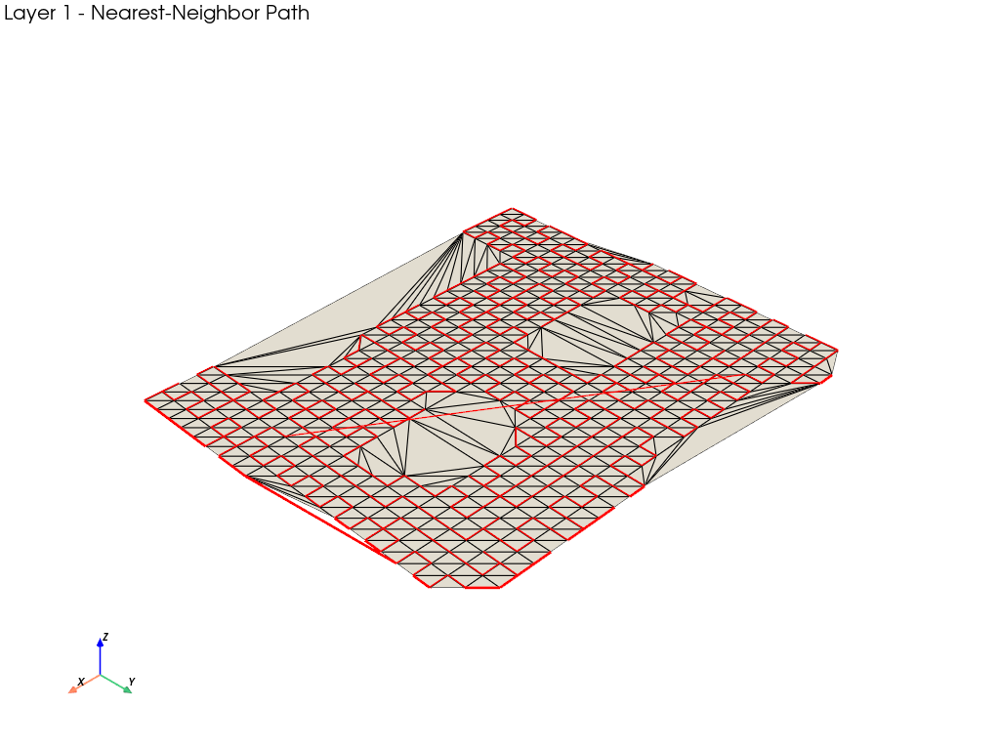

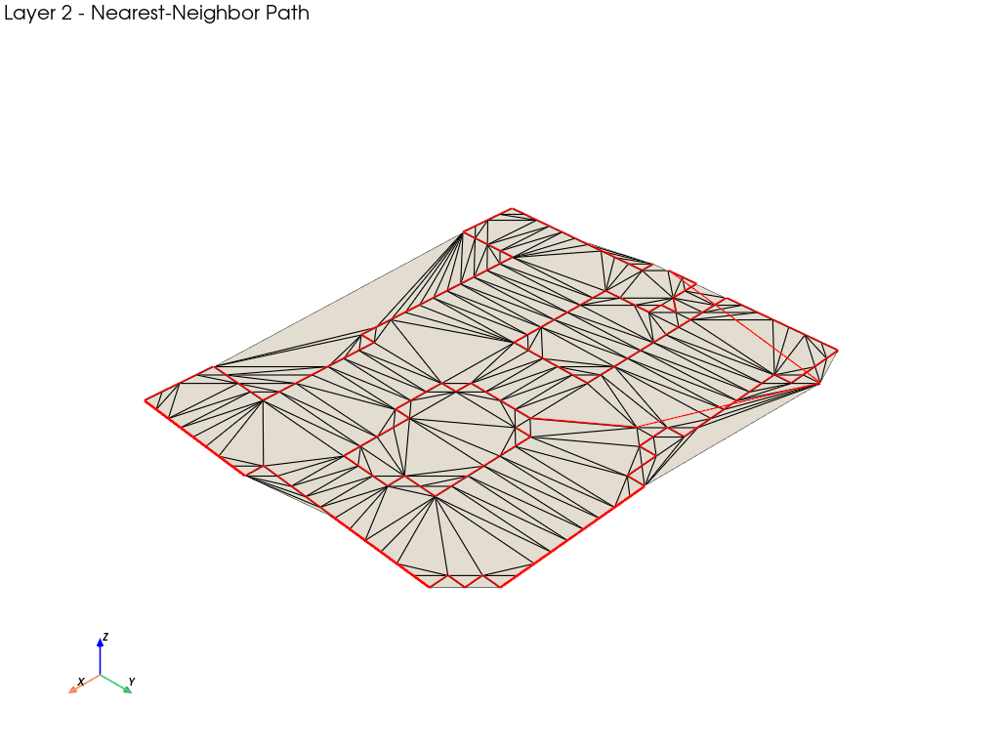

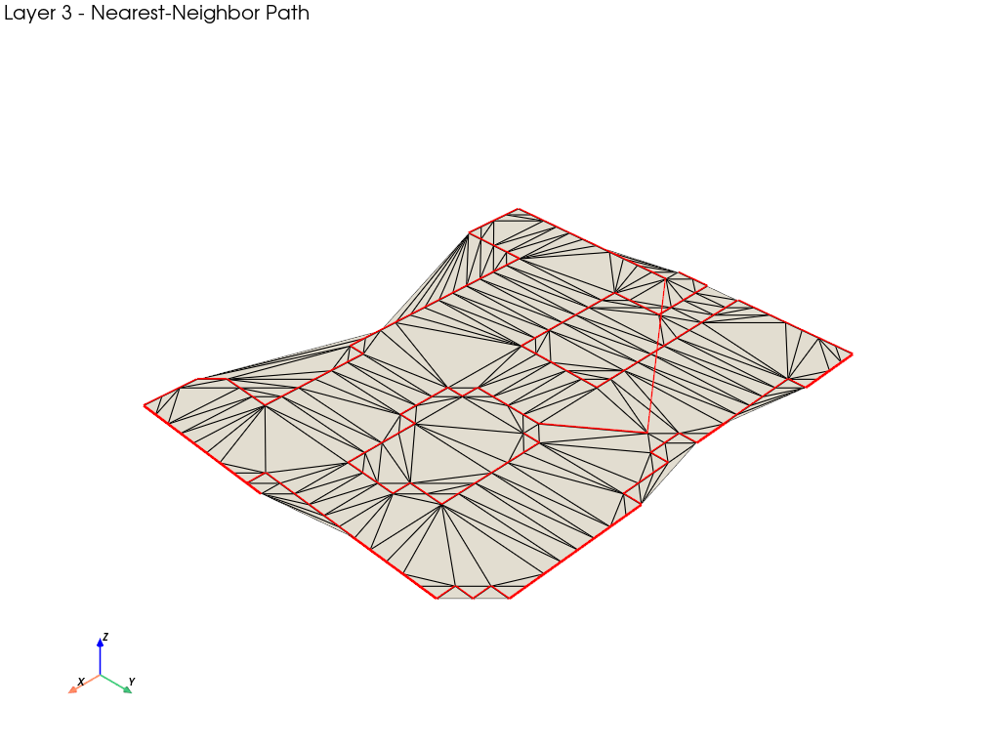

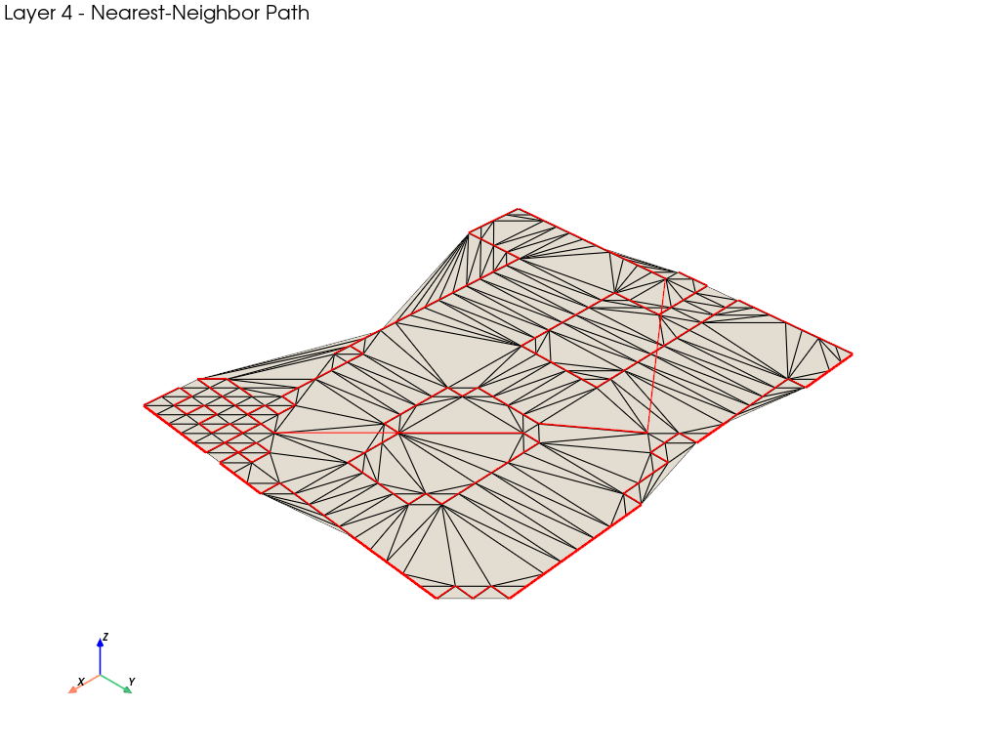

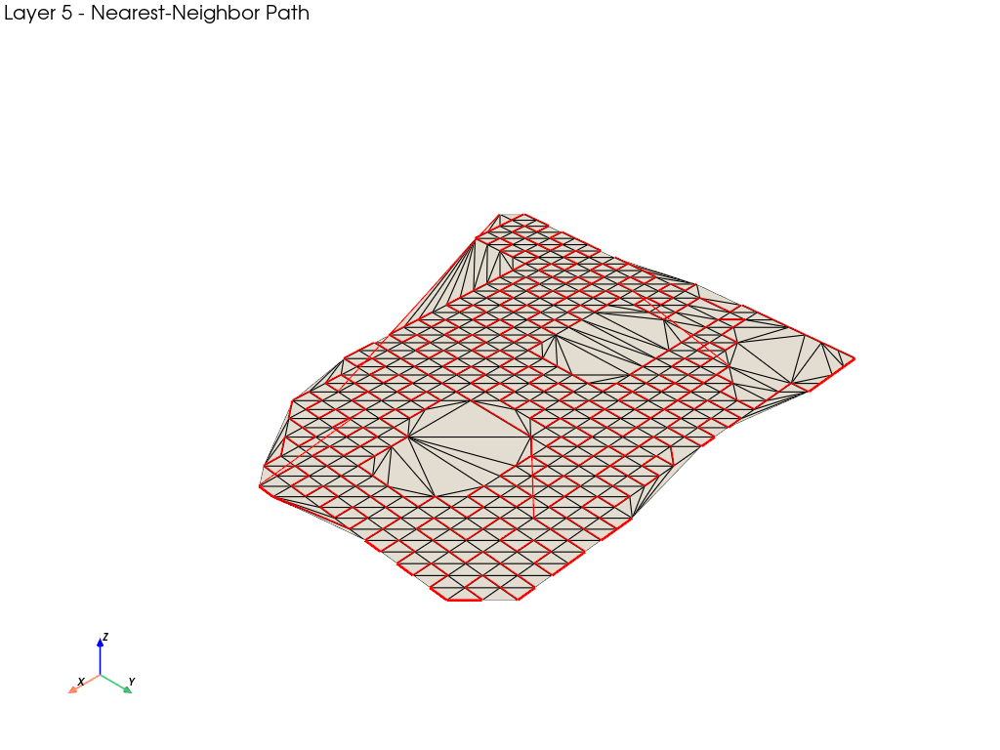

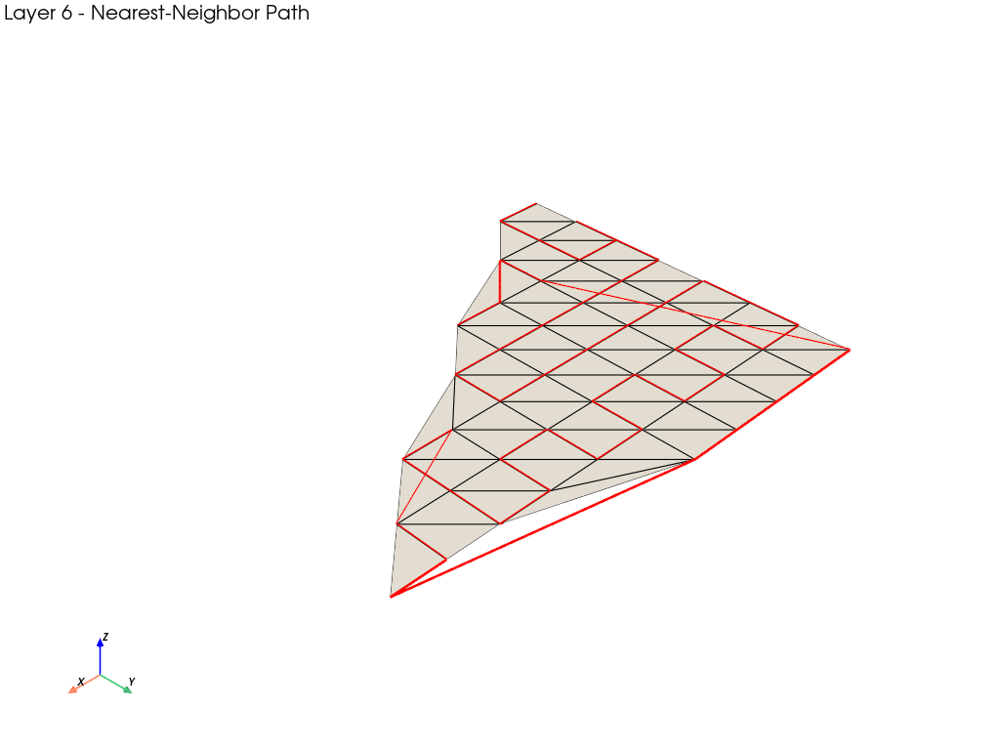

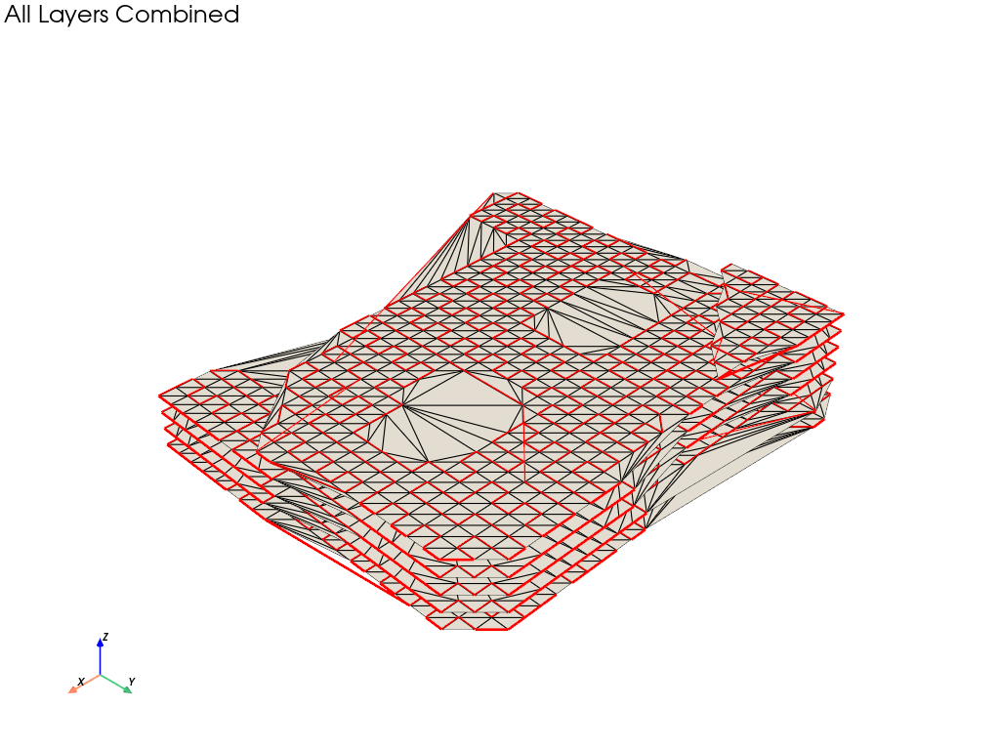

In [21]:
import numpy as np
import pyvista as pv
from shapely.geometry import Polygon, LineString

X, Y, Z = occupancy.shape

pitch = 0.03  # Example voxel size
origin = (0.0, 0.0, 0.0)

# Laser path parameters
velocity_x = 0.05  # m/s
dt = 0.1           # s

# Store data for the final stack
all_boundary_polygons = []
all_path_points = []

for k in range(Z):
    slice_k = occupancy[:, :, k]
    layer_z = origin[2] + k * pitch

    # Identify all occupied cells in the layer
    occupied_indices = np.argwhere(slice_k == 1)  # Get all (i, j) indices where occupancy == 1
    if occupied_indices.size == 0:
        # No material in this layer
        continue

    # Convert occupied indices to real-world coordinates
    real_coords = []
    for i, j in occupied_indices:
        x = origin[0] + (i + 0.5) * pitch  # i corresponds to x
        y = origin[1] + (j + 0.5) * pitch  # j corresponds to y
        real_coords.append((x, y))
    real_coords = np.array(real_coords)

    # Create a polygon representing the occupied region
    polygon = Polygon(real_coords)
    if polygon.is_empty or polygon.area == 0:
        continue

    # Nearest-neighbor path construction
    start_idx = np.lexsort((real_coords[:, 1], real_coords[:, 0]))[0]  # Start from leftmost-bottommost
    current_point = real_coords[start_idx]
    path = [current_point]
    remaining_points = np.delete(real_coords, start_idx, axis=0)

    while len(remaining_points) > 0:
        distances = np.linalg.norm(remaining_points - current_point, axis=1)
        next_idx = np.argmin(distances)  # Find the nearest point
        next_point = remaining_points[next_idx]
        path.append(next_point)
        current_point = next_point
        remaining_points = np.delete(remaining_points, next_idx, axis=0)

    # Add Z-coordinate to the path for this layer
    path_points = np.array([[p[0], p[1], layer_z] for p in path])

    # Store this layer's geometry and path
    all_boundary_polygons.append((polygon, layer_z))
    all_path_points.append(path_points)

    # ---- Visualize each layer individually ----
    individual_plotter = pv.Plotter()
    individual_plotter.add_axes()

    # Convert polygon boundary to 3D
    boundary_coords = np.array(polygon.exterior.coords)
    boundary_coords_3d = np.hstack([boundary_coords, np.full((boundary_coords.shape[0], 1), layer_z)])
    boundary_poly = pv.PolyData(boundary_coords_3d).delaunay_2d()
    individual_plotter.add_mesh(boundary_poly, color="white", show_edges=True, label=f"Layer {k+1} Footprint")

    if len(path_points) > 1:
        line = pv.lines_from_points(path_points)
        individual_plotter.add_mesh(line, color="red", line_width=3, label=f"Layer {k+1} Path")

    individual_plotter.add_text(f"Layer {k+1} - Nearest-Neighbor Path", position="upper_left", font_size=10)
    individual_plotter.show()  # Display this layer's visualization
    # After closing this window, move on to the next layer

# ---- Show the final stack with all layers ----
final_plotter = pv.Plotter()
final_plotter.add_axes()
final_plotter.add_text("All Layers Combined", position="upper_left", font_size=10)

for (poly, z_val) in all_boundary_polygons:
    boundary_coords = np.array(poly.exterior.coords)
    boundary_coords_3d = np.hstack([boundary_coords, np.full((boundary_coords.shape[0], 1), z_val)])
    boundary_poly = pv.PolyData(boundary_coords_3d).delaunay_2d()
    final_plotter.add_mesh(boundary_poly, color="white", show_edges=True)

for p_points in all_path_points:
    if len(p_points) > 1:
        line = pv.lines_from_points(p_points)
        final_plotter.add_mesh(line, color="red", line_width=3)

final_plotter.show()  # Show the entire stack


In [13]:
def moving_gaussian_heat_source(x, t, z_layer, minX, maxX, minY, maxY, velocity_x, y_step):
    """
    Moving Gaussian heat source along a grid of parallel lines in x-y directions.
    - Moves along x at each y-line (parallel lines).
    - Progresses along y in steps to form a grid pattern.
    """
    # Calculate the current y-line based on time
    total_time_x = (maxX - minX) / velocity_x  # Time to traverse one x-line
    num_y_lines = int((maxY - minY) / y_step) + 1
    y_line_index = int(t // total_time_x) % num_y_lines  # Current y-line (wraps around)
    local_time_x = t % total_time_x  # Time within the current x-line traversal

    # Current x position of the heat source
    x_position = minX + velocity_x * local_time_x
    if x_position > maxX:
        x_position = maxX  # Clamp to maxX if it overshoots

    # Current y position of the heat source
    y_position = minY + y_line_index * y_step
    if y_position > maxY:
        y_position = maxY  # Clamp to maxY if it overshoots

    # Center of the heat source
    center = np.array([x_position, y_position, z_layer])

    # Gaussian profile
    intensity = 1e6  # Heat intensity (W/m^3)
    radius = 0.1  # Laser radius (m)
    r = np.linalg.norm(x - center[:, np.newaxis], axis=0)  # Distance from the laser center
    return intensity * np.exp(-r**2 / (2 * radius**2))  # Gaussian profile


Simulating layer 1/4 at z = 0.0
Heat source max: 998138.7032482196, min: 3.807120477265194e-10
Max Temperature: 100.43300386270161
Min Temperature: 98.29223065605633


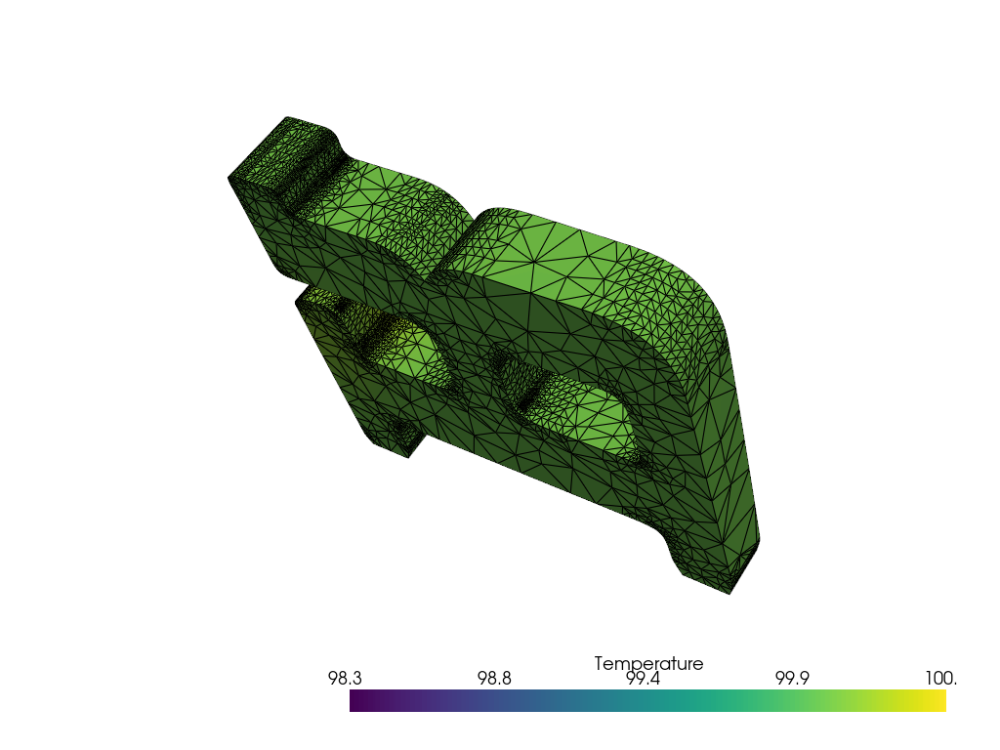

Layer 1 completed.
Simulating layer 2/4 at z = 0.15
Heat source max: 998144.8140107754, min: 6.013343021698917e-13
Max Temperature: 100.6294028431385
Min Temperature: 98.29819114389291


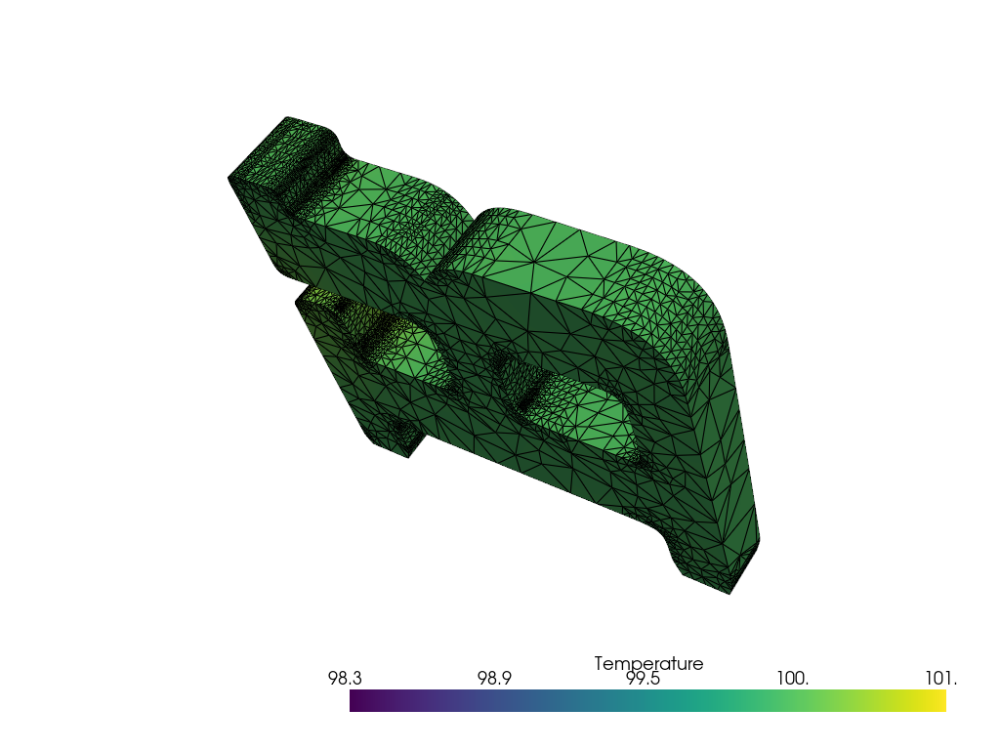

Layer 2 completed.
Simulating layer 3/4 at z = 0.3
Heat source max: 999210.7822470787, min: 9.68558405747479e-17
Max Temperature: 100.66844713691778
Min Temperature: 98.66937502255011


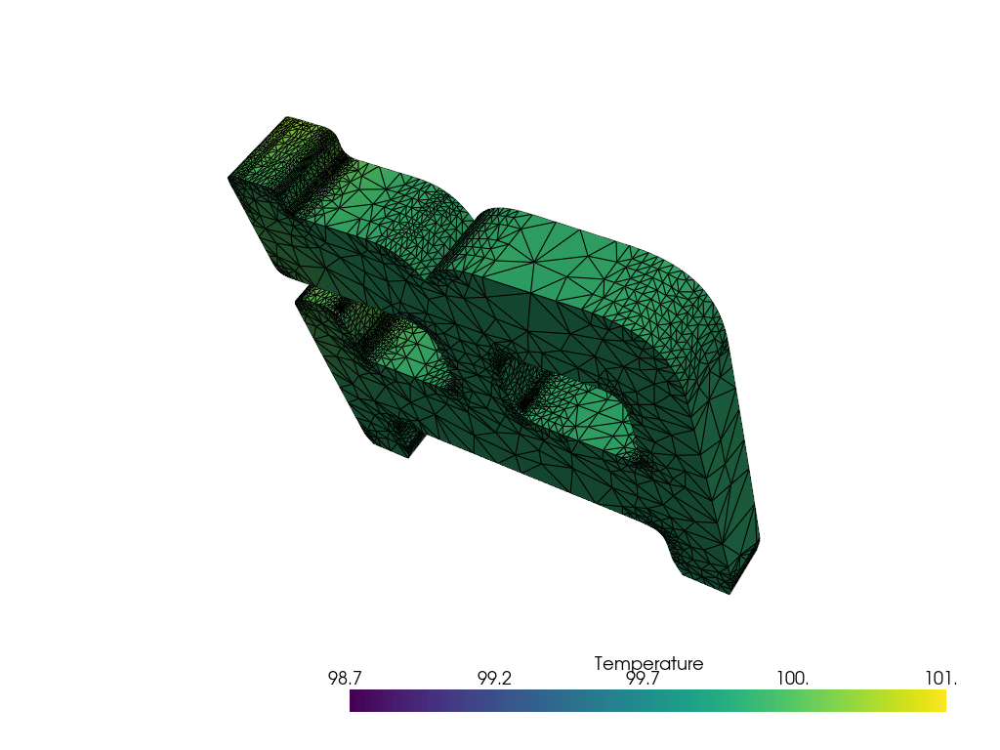

Layer 3 completed.
Simulating layer 4/4 at z = 0.44999999999999996
Skipping layer 4: no points found.


In [14]:
import numpy as np
import ufl
from dolfinx import fem
from dolfinx.fem.petsc import LinearProblem
from dolfinx.plot import vtk_mesh
from ufl import grad, dot

layer_height = 0.15
# Layer-by-layer simulation
num_layers = int((geometry[:, 2].max() - geometry[:, 2].min()) / layer_height)
for layer in range(num_layers):
    z_layer = layer * layer_height  # Current layer height
    print(f"Simulating layer {layer + 1}/{num_layers} at z = {z_layer}")

    # Define active layer subdomain
    def active_layer_subdomain(x):
        return np.logical_and(x[2] >= z_layer, x[2] < z_layer + layer_height)

    active_cells = locate_entities(domain_mesh, domain_mesh.topology.dim, active_layer_subdomain)
    dx_layer = ufl.Measure("dx", domain=domain_mesh, subdomain_data=active_cells)

    layer_indices = np.where(active_layer_subdomain(geometry.T))[0]
    if layer_indices.size == 0:
        print(f"Skipping layer {layer + 1}: no points found.")
        continue  # Skip this layer if no points are found

    # Extract bounds for x and y directions for the active layer
    layer_points = geometry[np.where(active_layer_subdomain(geometry.T))[0]]
    minX, maxX = layer_points[:, 0].min(), layer_points[:, 0].max()
    minY, maxY = layer_points[:, 1].min(), layer_points[:, 1].max()

    
    # Time-stepping within the layer
    for step in range(num_steps_per_layer):
        t = step * dt  # Time within the layer

        # Update the heat source for the current time step
        Q = fem.Function(V_T)
        Q.interpolate(lambda x: moving_gaussian_heat_source(
            x, t, z_layer, minX, maxX, minY, maxY, velocity_x, y_step
        ))

        # Define weak forms
        a_T = (rho * cp / dt) * T * v_T * dx_layer + k * dot(grad(T), grad(v_T)) * dx_layer
        L_T = (rho * cp / dt) * T_prev * v_T * dx_layer + Q * v_T * dx_layer

        # Solve for temperature
        temp_problem = LinearProblem(a_T, L_T, bcs=[bc_T])
        T_sol = temp_problem.solve()

        # Update T_prev for the next time step
        T_prev.x.array[:] = T_sol.x.array[:]

    # After finishing the layer, update T_prev for the next layer
    T_prev.x.array[:] = T_sol.x.array[:]
    print(f"Heat source max: {Q.x.array.max()}, min: {Q.x.array.min()}")
    print(f"Max Temperature: {T_sol.x.array.max()}")
    print(f"Min Temperature: {T_sol.x.array.min()}")

    # Save the solution for visualization (optional)
    topology, cell_types, geometry = vtk_mesh(domain_mesh)
    grid = pv.UnstructuredGrid(topology, cell_types, geometry)
    grid.point_data["Temperature"] = T_sol.x.array
    grid.save(f"temperature_layer_{layer + 1}.vtk")
    import pyvista as pv

    plotter = pv.Plotter()
    plotter.add_mesh(grid, show_edges=True, scalars="Temperature", cmap="viridis")
    plotter.add_scalar_bar(title="Temperature")
    plotter.show()


    print(f"Layer {layer + 1} completed.")



Simulating layer 1/4 at z = 0.0


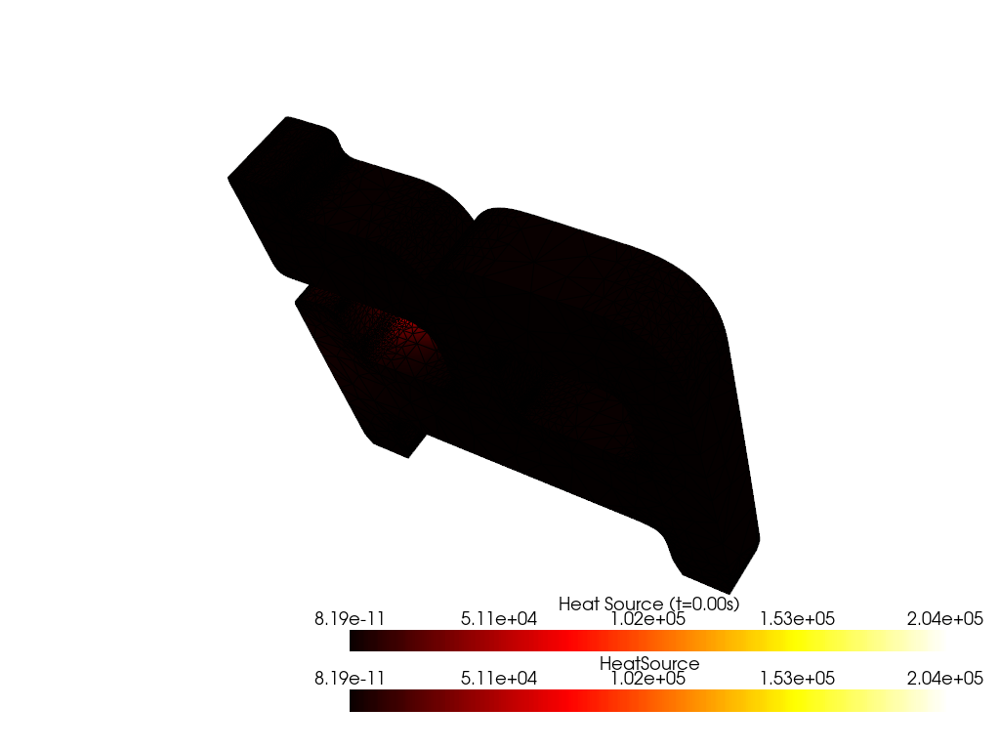

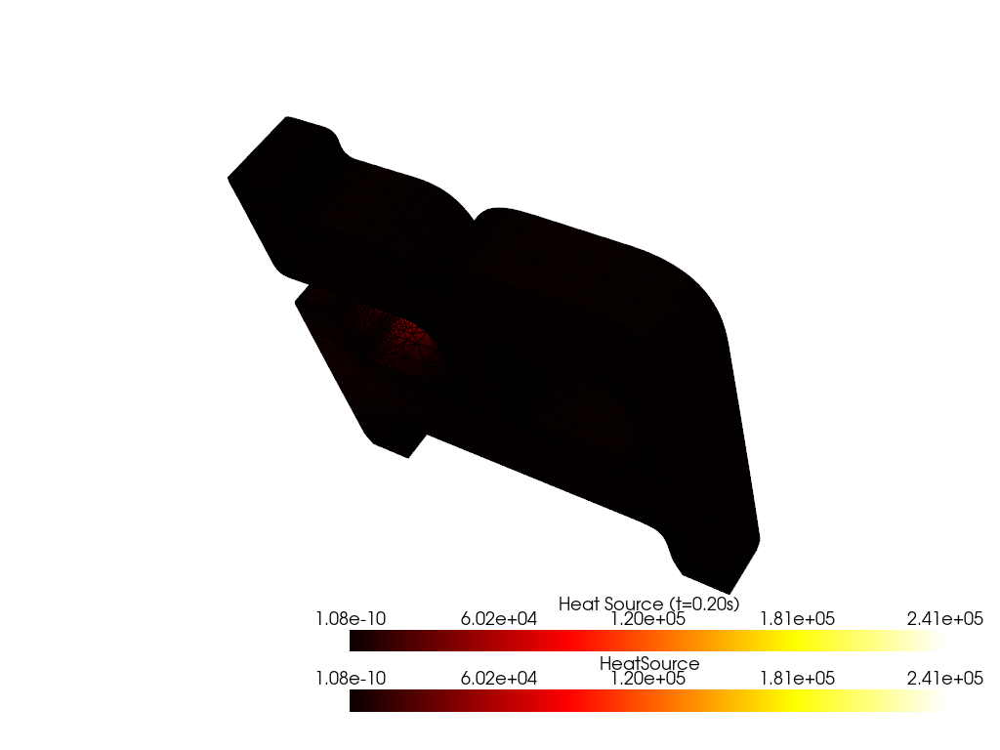

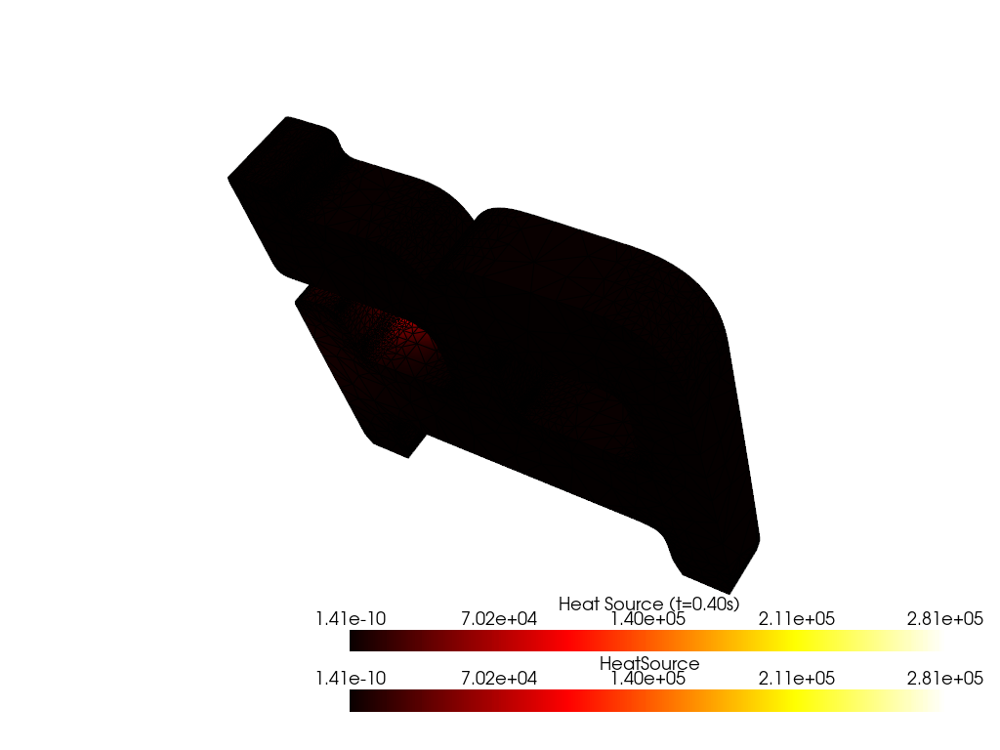

KeyboardInterrupt: 

In [18]:
import numpy as np
import ufl
from dolfinx import fem
from dolfinx.fem.petsc import LinearProblem
from dolfinx.plot import vtk_mesh
from ufl import grad, dot
import pyvista as pv
import random

layer_height = 0.15
# Layer-by-layer simulation

num_layers = int((geometry[:, 2].max() - geometry[:, 2].min()) / layer_height)
for layer in range(num_layers):
    z_layer = layer * layer_height  # Current layer height
    print(f"Simulating layer {layer + 1}/{num_layers} at z = {z_layer}")

    # Define active layer subdomain
    def active_layer_subdomain(x):
        return np.logical_and(x[2] >= z_layer, x[2] < z_layer + layer_height)

    active_cells = locate_entities(domain_mesh, domain_mesh.topology.dim, active_layer_subdomain)
    dx_layer = ufl.Measure("dx", domain=domain_mesh, subdomain_data=active_cells)

    layer_indices = np.where(active_layer_subdomain(geometry.T))[0]
    if layer_indices.size == 0:
        print(f"Skipping layer {layer + 1}: no points found.")
        continue  # Skip this layer if no points are found

    # Randomly sample 10 time steps within the layer time
    total_time_layer = num_steps_per_layer * dt
    random_times = sorted(random.sample(range(num_steps_per_layer), 10))  # Random time steps as indices

    # Loop over the randomly sampled time steps
    for step in random_times:
        t = step * dt  # Time for the current random step

        # Update the heat source for the current time step
        Q = fem.Function(V_T)
        Q.interpolate(lambda x: moving_gaussian_heat_source(
            x, t, z_layer, geometry[:, 0].min(), geometry[:, 0].max(),
            geometry[:, 1].min(), geometry[:, 1].max(), velocity_x, y_step
        ))

        # Visualize the entire object with the heat source applied
        full_grid = grid.copy()  # Use the entire grid for visualization
        full_grid.point_data["HeatSource"] = Q.x.array  # Assign heat source to all points

        # Plot the entire grid with the heat source
        plotter = pv.Plotter()
        plotter.add_mesh(full_grid, show_edges=True, scalars="HeatSource", cmap="hot")
        plotter.add_scalar_bar(title=f"Heat Source (t={t:.2f}s)")
        plotter.show()

    # Solve temperature field for the layer
    for step in range(num_steps_per_layer):
        t = step * dt  # Time within the layer

        # Define weak forms
        a_T = (rho * cp / dt) * T * v_T * dx_layer + k * dot(grad(T), grad(v_T)) * dx_layer
        L_T = (rho * cp / dt) * T_prev * v_T * dx_layer + Q * v_T * dx_layer

        # Solve for temperature
        temp_problem = LinearProblem(a_T, L_T, bcs=[bc_T])
        T_sol = temp_problem.solve()

        # Update T_prev for the next time step
        T_prev.x.array[:] = T_sol.x.array[:]

    # After finishing the layer, update T_prev for the next layer
    T_prev.x.array[:] = T_sol.x.array[:]
    print(f"Layer {layer + 1} completed.")


In [ ]:
#Todo: Implement the stress displacement off of the
#      temperature displacement that we now have